In [1]:
import os
print(os.listdir("C:\Hashir\Photos - Copy"))

['class1', 'class10', 'class11', 'class12', 'class13', 'class14', 'class15', 'class16', 'class17', 'class18', 'class19', 'class2', 'class20', 'class21', 'class22', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9', 'gan-introduction.ipynb', 'results']


**Importing the libraries**

In [2]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

There are 957 pictures of shirts.


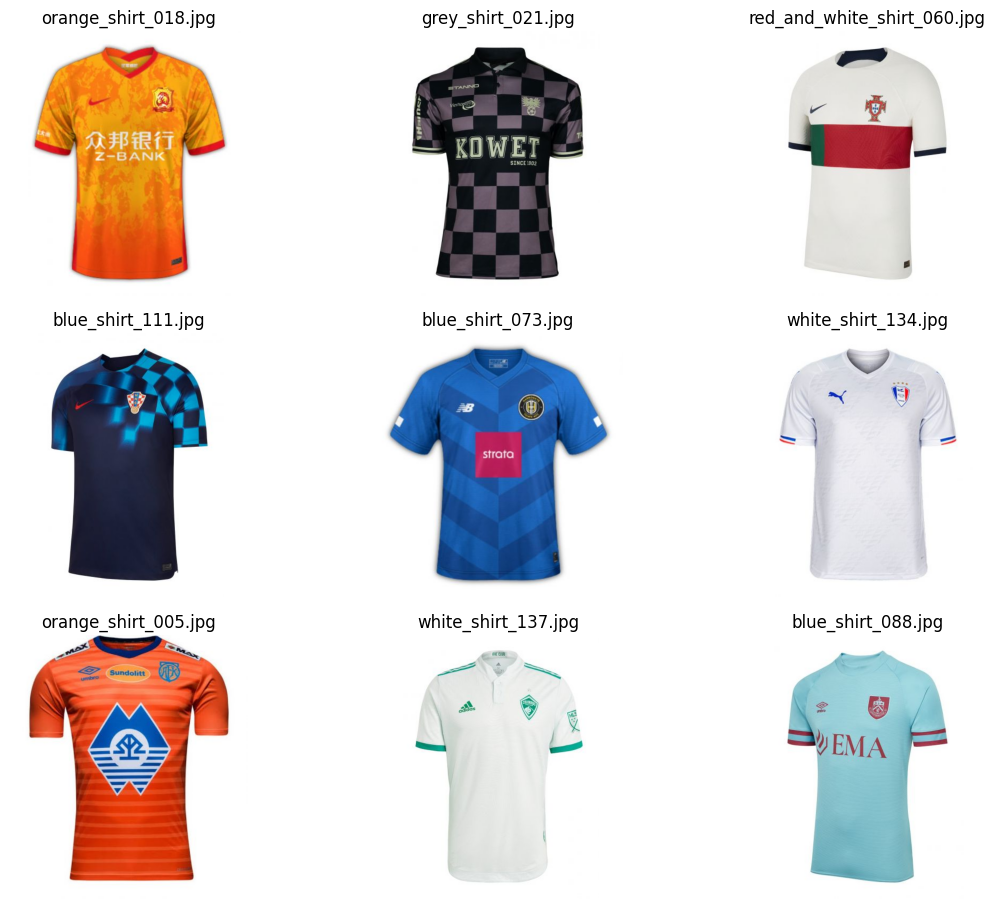

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Corrected the path string to avoid syntax error with backslashes
PATH = r'C:\Hashir\Photos'
images = os.listdir(PATH)
print(f'There are {len(images)} pictures of shirts.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(images))
    img_path = os.path.join(PATH, images[rnd_indx])  # Build the full image path
    img = plt.imread(img_path)                      # Read the image
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()  # This line ensures that the plot will be shown if the script is run outside an interactive environment


# Image Preprocessing

**Initial code ...**

```
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('C:\Hashir\Photos - Copy', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

```

In [11]:
import os

def check_images(root_path):
    for dirname, _, filenames in os.walk(root_path):
        print(f"Directory: {dirname}")
        for filename in filenames:
            print(f"  File: {filename}")

check_images(r'C:\Hashir\Photos - Copy')


Directory: C:\Hashir\Photos - Copy
  File: gan-introduction.ipynb
Directory: C:\Hashir\Photos - Copy\class1
  File: black_and_blue_shirt_001.jpg
  File: black_and_blue_shirt_002.jpg
  File: black_and_blue_shirt_003.jpg
  File: black_and_blue_shirt_004.jpg
  File: black_and_blue_shirt_005.jpg
  File: black_and_blue_shirt_006.jpg
  File: black_and_blue_shirt_008.jpg
  File: black_and_blue_shirt_009.jpg
  File: black_and_blue_shirt_010.jpg
  File: black_and_blue_shirt_011.jpg
  File: black_and_blue_shirt_012.jpg
  File: black_and_blue_shirt_013.jpg
Directory: C:\Hashir\Photos - Copy\class10
  File: blue_shirt_001.jpg
  File: blue_shirt_002.jpg
  File: blue_shirt_003.jpg
  File: blue_shirt_004.jpg
  File: blue_shirt_005.jpg
  File: blue_shirt_006.jpg
  File: blue_shirt_007.jpg
  File: blue_shirt_008.jpg
  File: blue_shirt_009.jpg
  File: blue_shirt_010.jpg
  File: blue_shirt_011.jpg
  File: blue_shirt_012.jpg
  File: blue_shirt_013.jpg
  File: blue_shirt_014.jpg
  File: blue_shirt_015.jpg


In [13]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('C:\Hashir\Photos - Copy', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


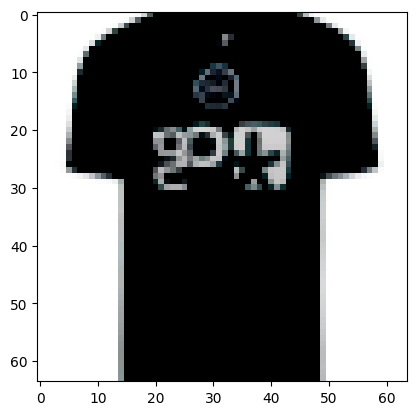

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


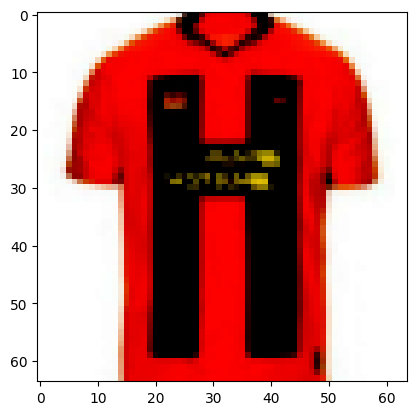

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


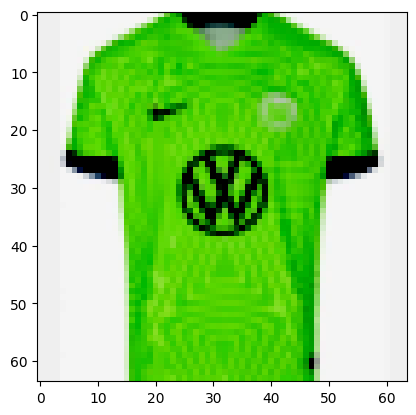

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


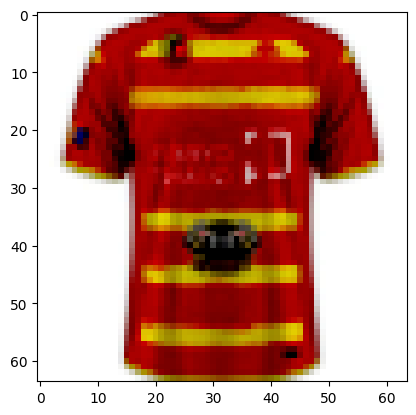

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


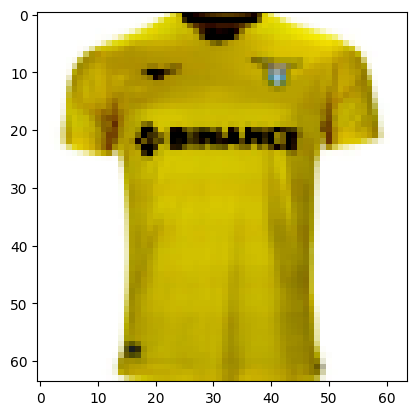

In [14]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

# Weights
### Defining the weights_init function

In [15]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [16]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [17]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Another setup

In [18]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Training

**My training baseline**

In [19]:
!mkdir results
!ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [20]:
EPOCH = 0 # play with me
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

This doesn't run because EPOCH = 0, change it and try ;)

In [21]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

### Parameters

In [22]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Initialize models and optimizers

In [23]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

**Plot Loss per EPOCH**
> plot_loss()

In [24]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

**Show generated images**
> show_generated_img()

In [25]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

### Training Loop

C:\Users\Muhammad Rafay\AppData\Local\Temp\ipykernel_17764\3139552926.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/30 [00:00<?, ?it/s]

[1/100][15/30] Loss_D: 1.3186 Loss_G: 3.8476 D(x): 0.2733 D(G(z)): 0.0046 / 0.0219
[1/100][30/30] Loss_D: 1.1225 Loss_G: 3.7940 D(x): 0.8223 D(G(z)): 0.4314 / 0.0261


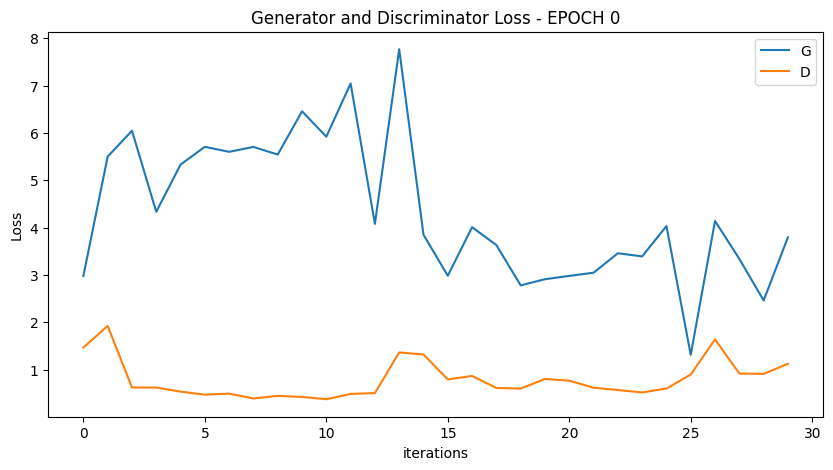

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


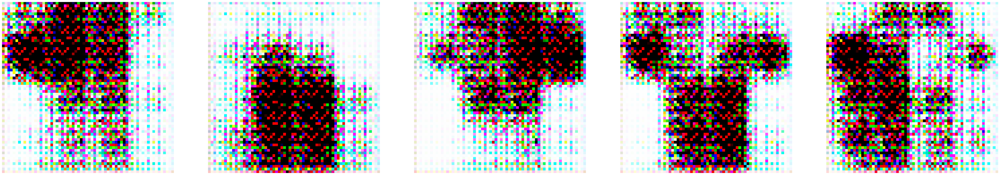

  0%|          | 0/30 [00:00<?, ?it/s]

[2/100][15/30] Loss_D: 0.6235 Loss_G: 3.5328 D(x): 0.8108 D(G(z)): 0.1753 / 0.0218
[2/100][30/30] Loss_D: 1.8306 Loss_G: 1.5025 D(x): 0.3762 D(G(z)): 0.4980 / 0.2156


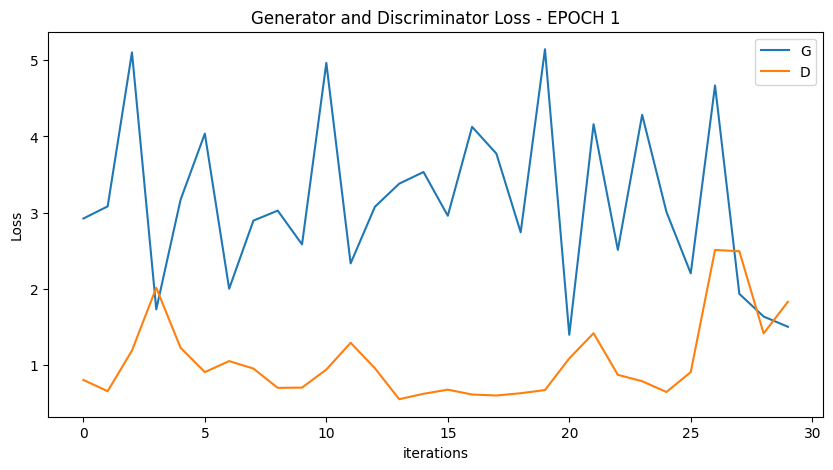

  0%|          | 0/30 [00:00<?, ?it/s]

[3/100][15/30] Loss_D: 1.1727 Loss_G: 1.9900 D(x): 0.5075 D(G(z)): 0.3512 / 0.1268
[3/100][30/30] Loss_D: 1.5681 Loss_G: 2.7786 D(x): 0.2500 D(G(z)): 0.0338 / 0.0702


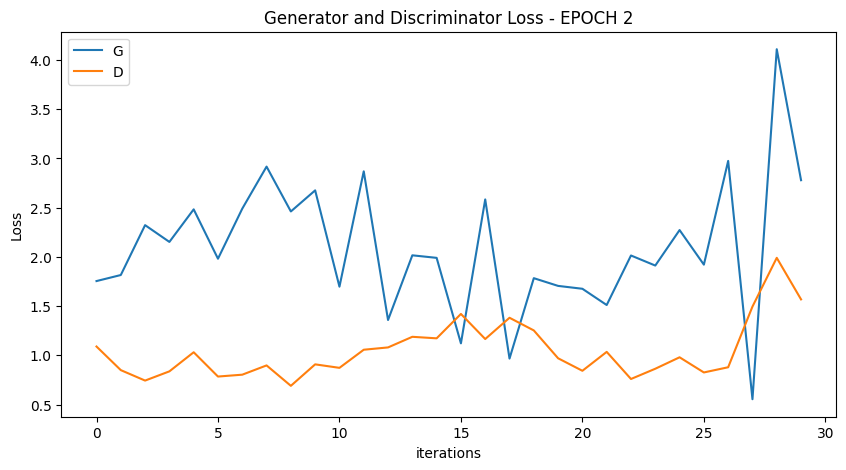

  0%|          | 0/30 [00:00<?, ?it/s]

[4/100][15/30] Loss_D: 1.0264 Loss_G: 1.7464 D(x): 0.6271 D(G(z)): 0.3777 / 0.1539
[4/100][30/30] Loss_D: 1.0137 Loss_G: 1.3921 D(x): 0.5857 D(G(z)): 0.3121 / 0.2316


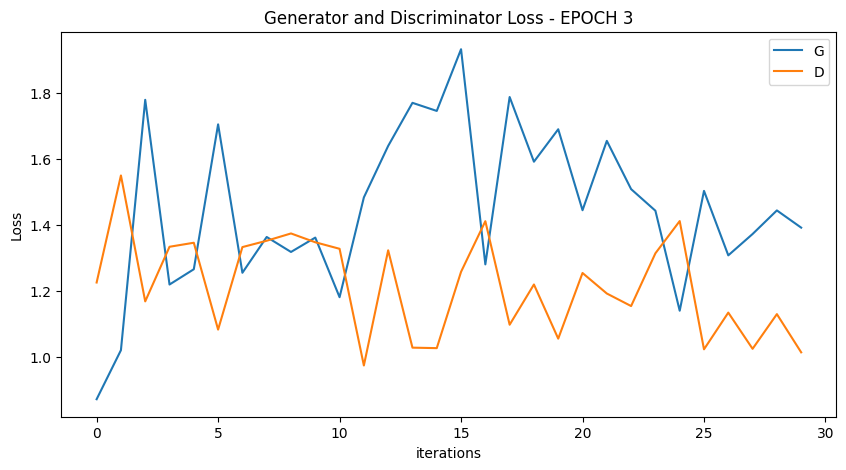

  0%|          | 0/30 [00:00<?, ?it/s]

[5/100][15/30] Loss_D: 1.2936 Loss_G: 1.4920 D(x): 0.4623 D(G(z)): 0.3698 / 0.2134
[5/100][30/30] Loss_D: 1.0842 Loss_G: 1.3315 D(x): 0.4653 D(G(z)): 0.2445 / 0.2481


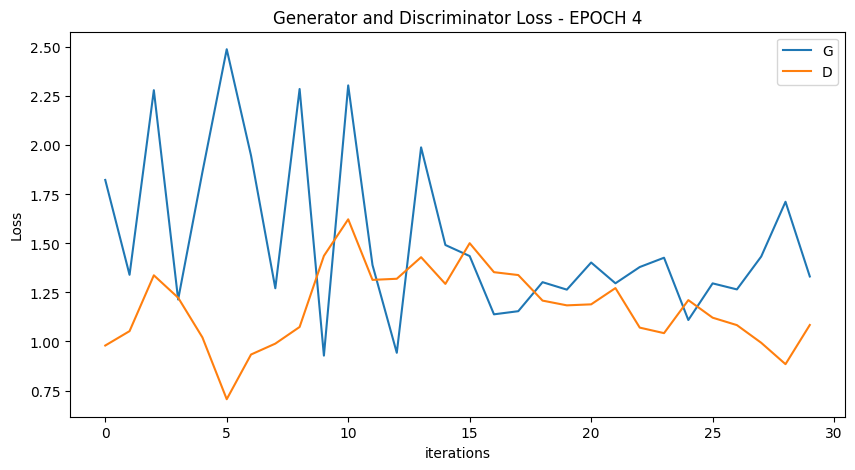

  0%|          | 0/30 [00:00<?, ?it/s]

[6/100][15/30] Loss_D: 1.0750 Loss_G: 1.4876 D(x): 0.5104 D(G(z)): 0.2889 / 0.2078
[6/100][30/30] Loss_D: 1.1337 Loss_G: 1.4672 D(x): 0.5060 D(G(z)): 0.3179 / 0.2099


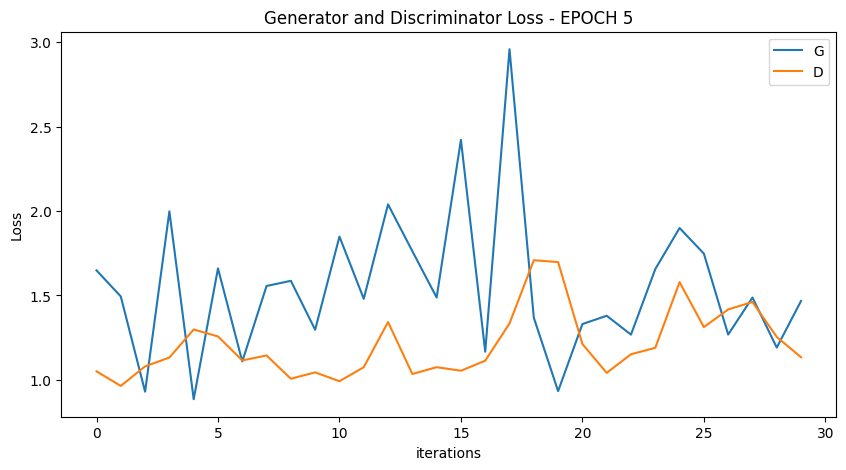

  0%|          | 0/30 [00:00<?, ?it/s]

[7/100][15/30] Loss_D: 1.2031 Loss_G: 1.4802 D(x): 0.5592 D(G(z)): 0.4269 / 0.2126
[7/100][30/30] Loss_D: 1.1358 Loss_G: 1.6023 D(x): 0.7152 D(G(z)): 0.4914 / 0.1920


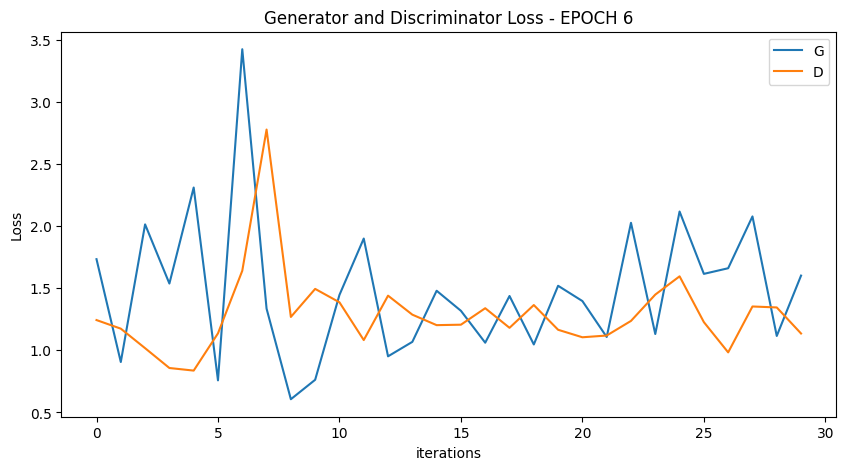

  0%|          | 0/30 [00:00<?, ?it/s]

[8/100][15/30] Loss_D: 1.2258 Loss_G: 1.2581 D(x): 0.6027 D(G(z)): 0.4735 / 0.2641
[8/100][30/30] Loss_D: 1.1954 Loss_G: 1.4749 D(x): 0.5544 D(G(z)): 0.4118 / 0.2132


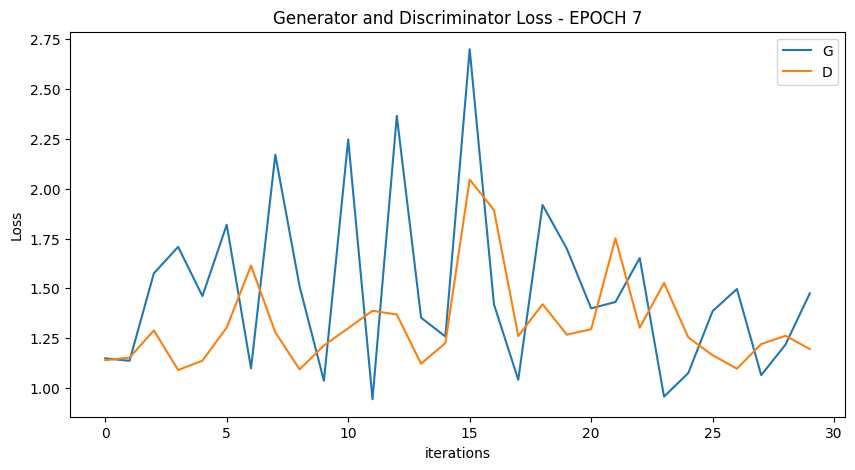

  0%|          | 0/30 [00:00<?, ?it/s]

[9/100][15/30] Loss_D: 1.2116 Loss_G: 1.4850 D(x): 0.5671 D(G(z)): 0.4121 / 0.2028
[9/100][30/30] Loss_D: 1.2219 Loss_G: 1.2227 D(x): 0.5743 D(G(z)): 0.4432 / 0.2755


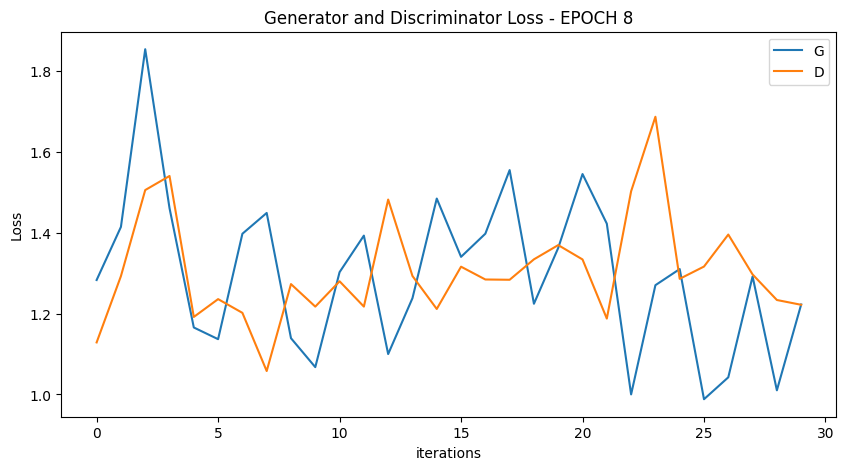

  0%|          | 0/30 [00:00<?, ?it/s]

[10/100][15/30] Loss_D: 1.0608 Loss_G: 1.5143 D(x): 0.5754 D(G(z)): 0.3564 / 0.2058
[10/100][30/30] Loss_D: 1.0918 Loss_G: 1.5010 D(x): 0.5784 D(G(z)): 0.3522 / 0.2110


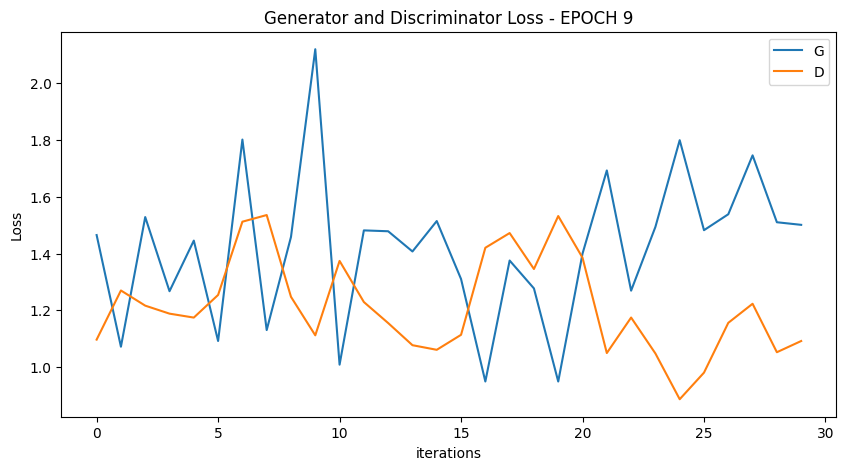

  0%|          | 0/30 [00:00<?, ?it/s]

[11/100][15/30] Loss_D: 1.2029 Loss_G: 1.7906 D(x): 0.4459 D(G(z)): 0.2756 / 0.1997
[11/100][30/30] Loss_D: 1.3971 Loss_G: 1.6997 D(x): 0.5272 D(G(z)): 0.5007 / 0.1725


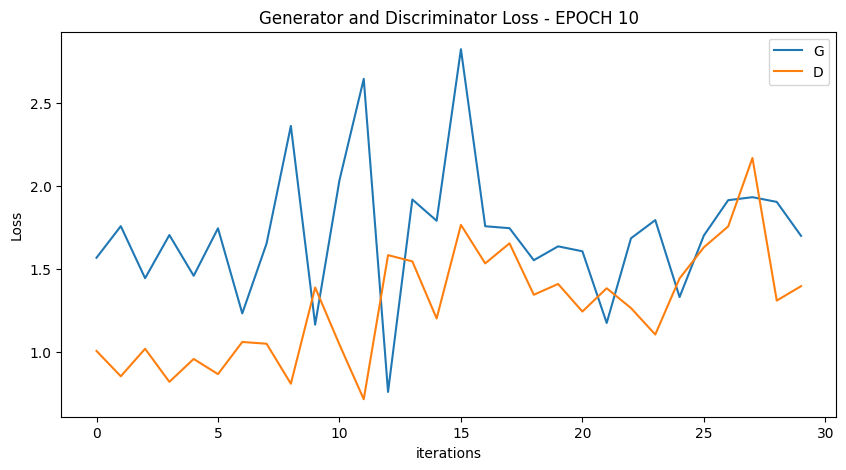

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


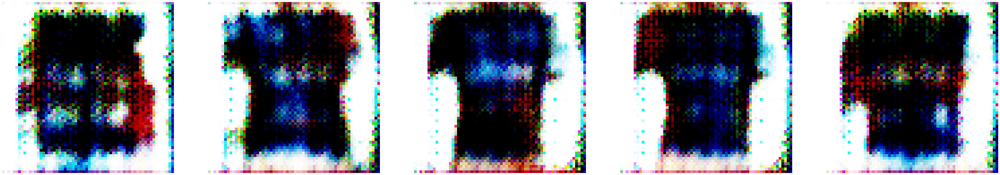

  0%|          | 0/30 [00:00<?, ?it/s]

[12/100][15/30] Loss_D: 0.8996 Loss_G: 1.7690 D(x): 0.6220 D(G(z)): 0.2837 / 0.1523
[12/100][30/30] Loss_D: 1.3567 Loss_G: 1.0431 D(x): 0.4900 D(G(z)): 0.3573 / 0.3540


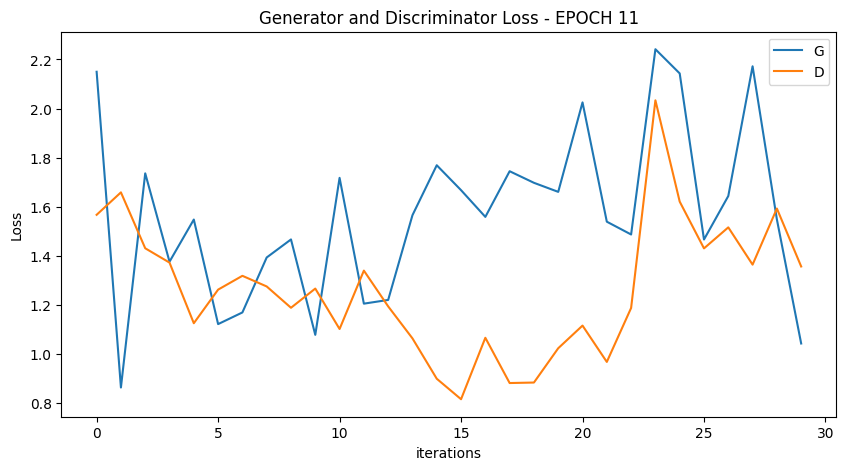

  0%|          | 0/30 [00:00<?, ?it/s]

[13/100][15/30] Loss_D: 1.0395 Loss_G: 1.8328 D(x): 0.5496 D(G(z)): 0.2699 / 0.1600
[13/100][30/30] Loss_D: 1.2883 Loss_G: 1.5844 D(x): 0.5775 D(G(z)): 0.4819 / 0.2157


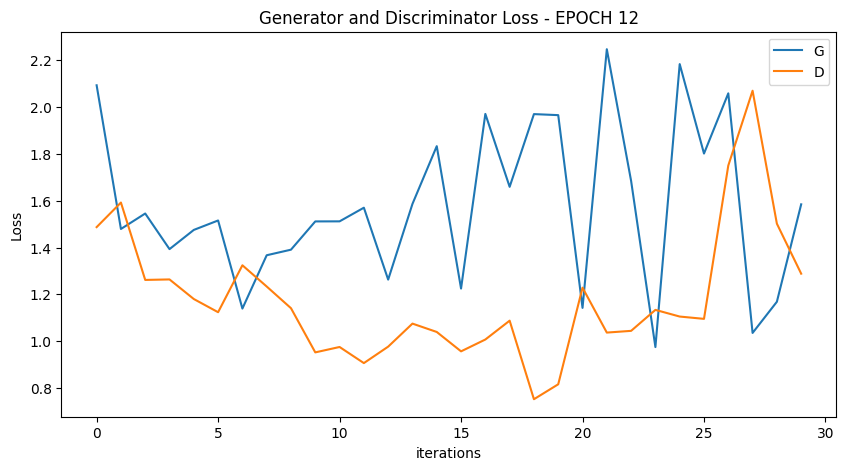

  0%|          | 0/30 [00:00<?, ?it/s]

[14/100][15/30] Loss_D: 0.9555 Loss_G: 1.6030 D(x): 0.5661 D(G(z)): 0.2575 / 0.2008
[14/100][30/30] Loss_D: 1.4080 Loss_G: 1.1115 D(x): 0.4204 D(G(z)): 0.3391 / 0.3280


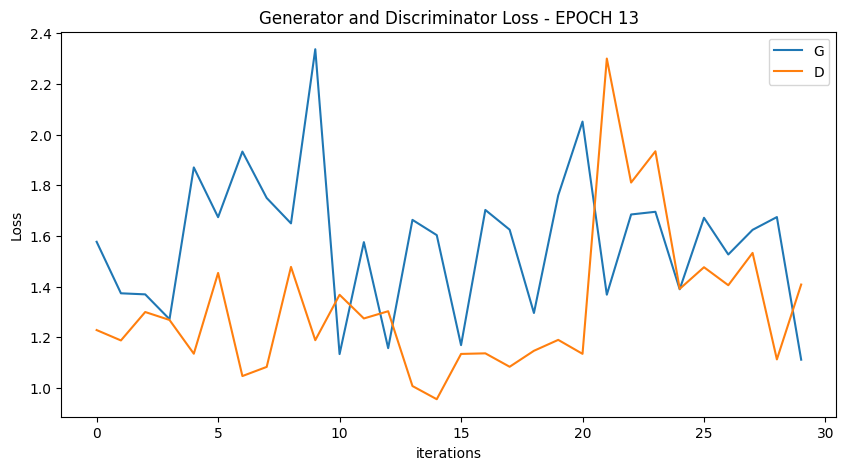

  0%|          | 0/30 [00:00<?, ?it/s]

[15/100][15/30] Loss_D: 1.3725 Loss_G: 1.4642 D(x): 0.4641 D(G(z)): 0.4250 / 0.2110
[15/100][30/30] Loss_D: 1.4183 Loss_G: 1.1433 D(x): 0.4574 D(G(z)): 0.3927 / 0.3051


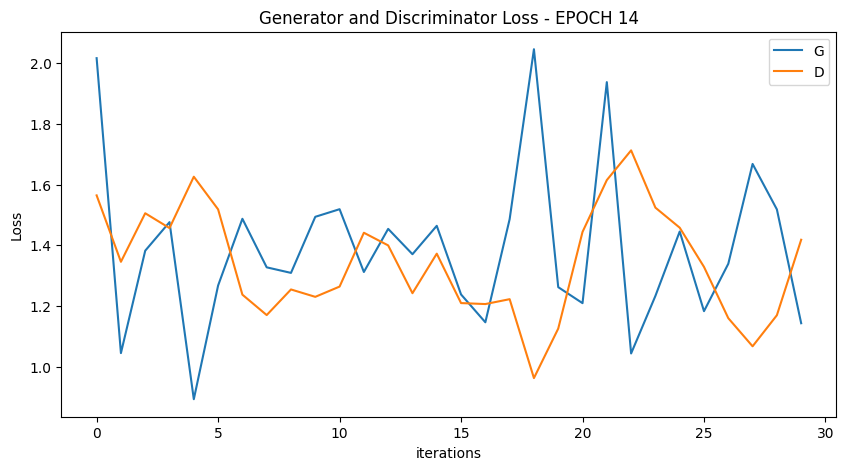

  0%|          | 0/30 [00:00<?, ?it/s]

[16/100][15/30] Loss_D: 1.1147 Loss_G: 1.3470 D(x): 0.5319 D(G(z)): 0.3395 / 0.2452
[16/100][30/30] Loss_D: 1.4086 Loss_G: 1.0610 D(x): 0.3359 D(G(z)): 0.2851 / 0.3410


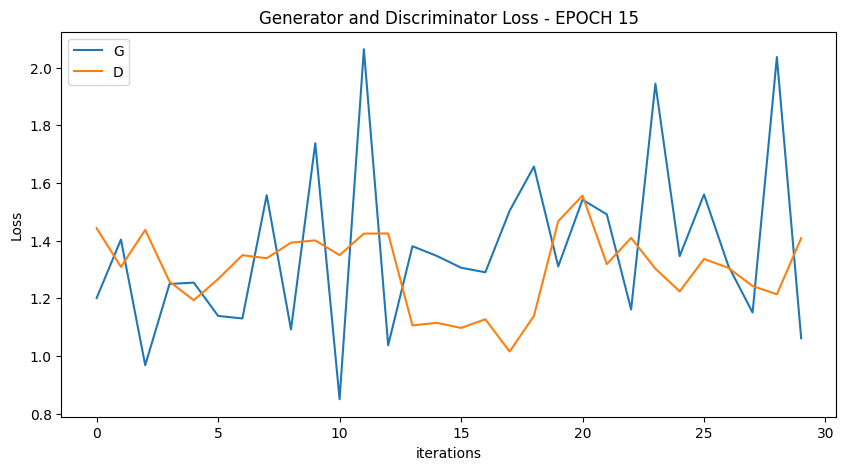

  0%|          | 0/30 [00:00<?, ?it/s]

[17/100][15/30] Loss_D: 1.1528 Loss_G: 1.1966 D(x): 0.5221 D(G(z)): 0.3610 / 0.2874
[17/100][30/30] Loss_D: 1.2151 Loss_G: 1.2969 D(x): 0.5550 D(G(z)): 0.4342 / 0.2589


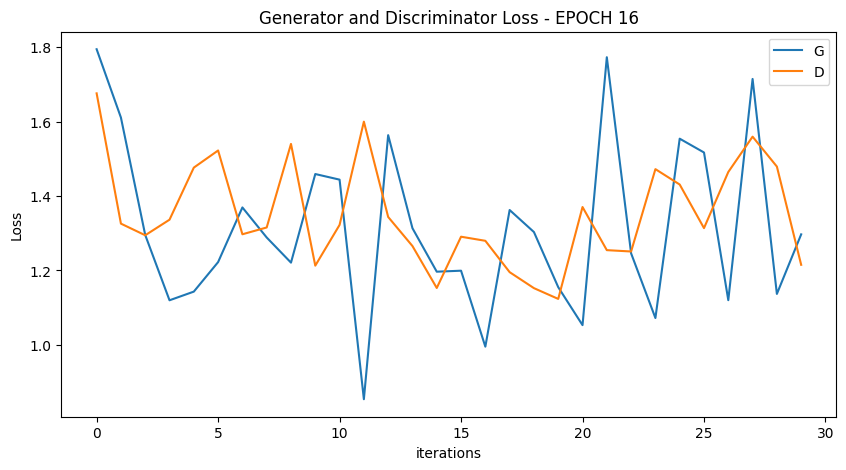

  0%|          | 0/30 [00:00<?, ?it/s]

[18/100][15/30] Loss_D: 1.3031 Loss_G: 1.0648 D(x): 0.4015 D(G(z)): 0.3110 / 0.3408
[18/100][30/30] Loss_D: 1.7290 Loss_G: 0.9554 D(x): 0.4078 D(G(z)): 0.5356 / 0.3763


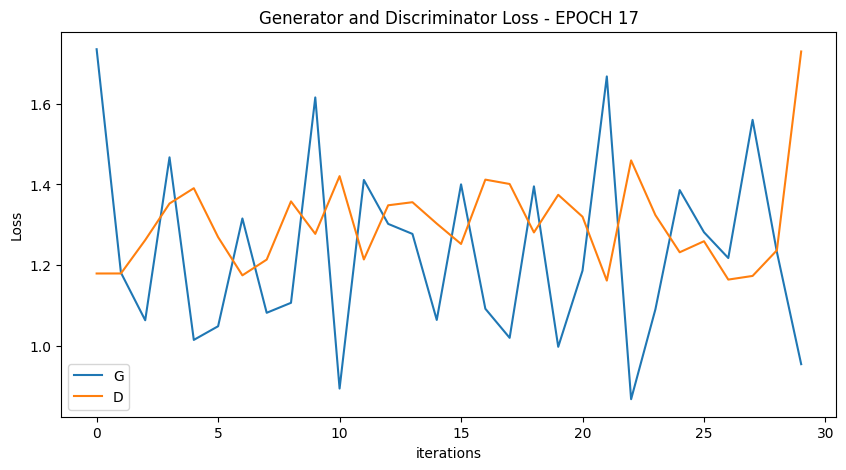

  0%|          | 0/30 [00:00<?, ?it/s]

[19/100][15/30] Loss_D: 1.5446 Loss_G: 1.0280 D(x): 0.4572 D(G(z)): 0.5131 / 0.3487
[19/100][30/30] Loss_D: 1.3452 Loss_G: 0.9795 D(x): 0.4175 D(G(z)): 0.3498 / 0.3644


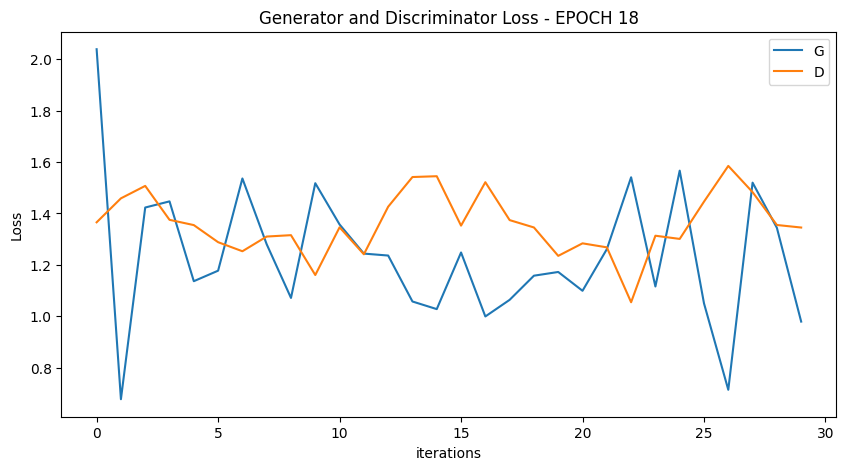

  0%|          | 0/30 [00:00<?, ?it/s]

[20/100][15/30] Loss_D: 1.3803 Loss_G: 1.1942 D(x): 0.3900 D(G(z)): 0.3537 / 0.2820
[20/100][30/30] Loss_D: 1.5340 Loss_G: 1.2017 D(x): 0.3319 D(G(z)): 0.3480 / 0.2816


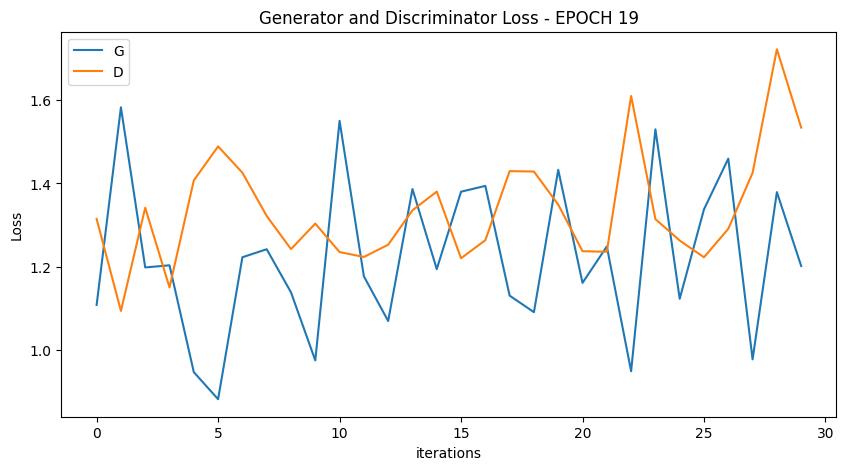

  0%|          | 0/30 [00:00<?, ?it/s]

[21/100][15/30] Loss_D: 1.3583 Loss_G: 1.3415 D(x): 0.4920 D(G(z)): 0.4579 / 0.2501
[21/100][30/30] Loss_D: 1.5099 Loss_G: 0.8416 D(x): 0.2953 D(G(z)): 0.2676 / 0.4413


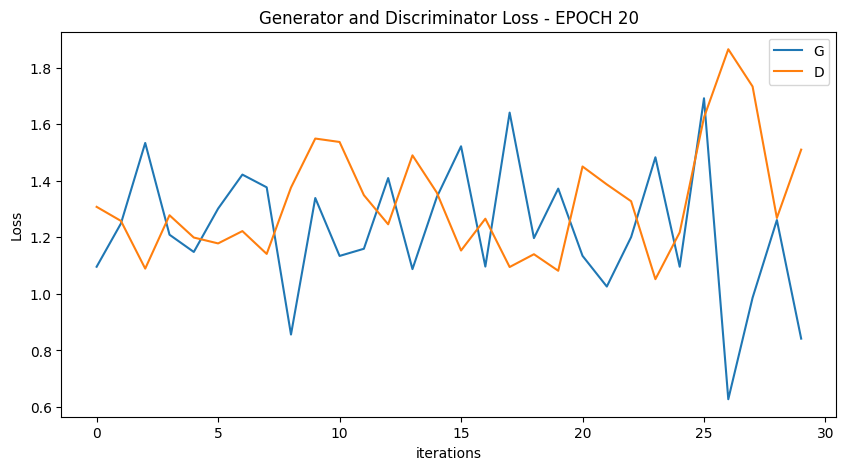

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


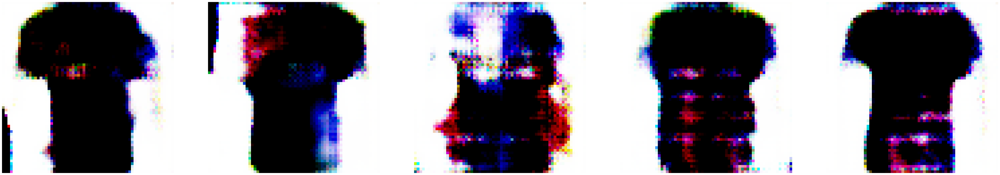

  0%|          | 0/30 [00:00<?, ?it/s]

[22/100][15/30] Loss_D: 1.3736 Loss_G: 1.1993 D(x): 0.3784 D(G(z)): 0.3180 / 0.2894
[22/100][30/30] Loss_D: 1.2047 Loss_G: 1.1087 D(x): 0.5336 D(G(z)): 0.4172 / 0.3095


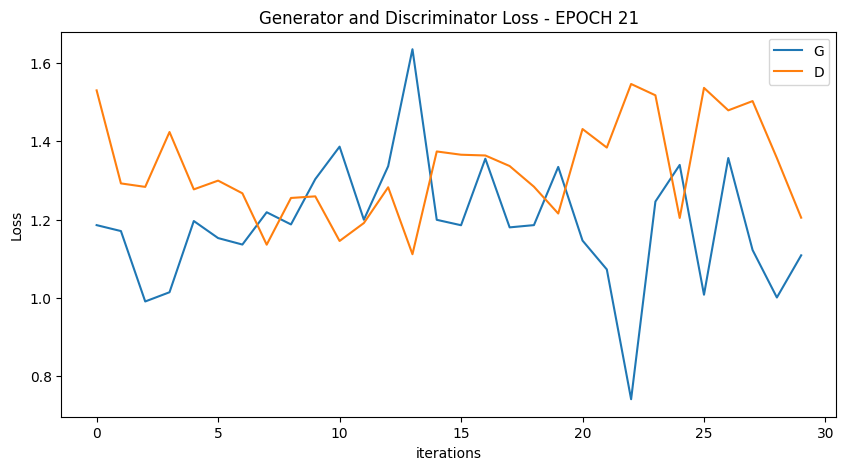

  0%|          | 0/30 [00:00<?, ?it/s]

[23/100][15/30] Loss_D: 1.3269 Loss_G: 1.0026 D(x): 0.3648 D(G(z)): 0.2778 / 0.3520
[23/100][30/30] Loss_D: 1.3951 Loss_G: 1.2392 D(x): 0.3520 D(G(z)): 0.2734 / 0.2923


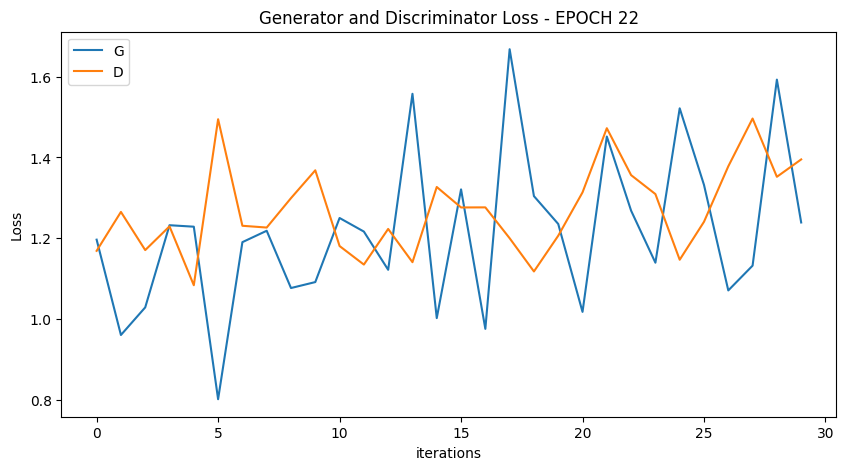

  0%|          | 0/30 [00:00<?, ?it/s]

[24/100][15/30] Loss_D: 1.3775 Loss_G: 0.9436 D(x): 0.4357 D(G(z)): 0.4038 / 0.3771
[24/100][30/30] Loss_D: 1.2669 Loss_G: 1.2674 D(x): 0.5100 D(G(z)): 0.4217 / 0.2660


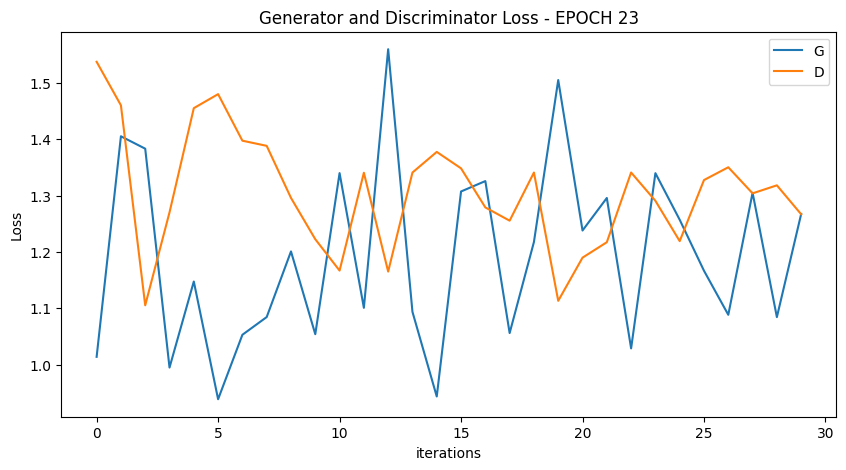

  0%|          | 0/30 [00:00<?, ?it/s]

[25/100][15/30] Loss_D: 1.1732 Loss_G: 1.4590 D(x): 0.6220 D(G(z)): 0.4521 / 0.2231
[25/100][30/30] Loss_D: 1.5046 Loss_G: 0.9155 D(x): 0.3305 D(G(z)): 0.3301 / 0.4022


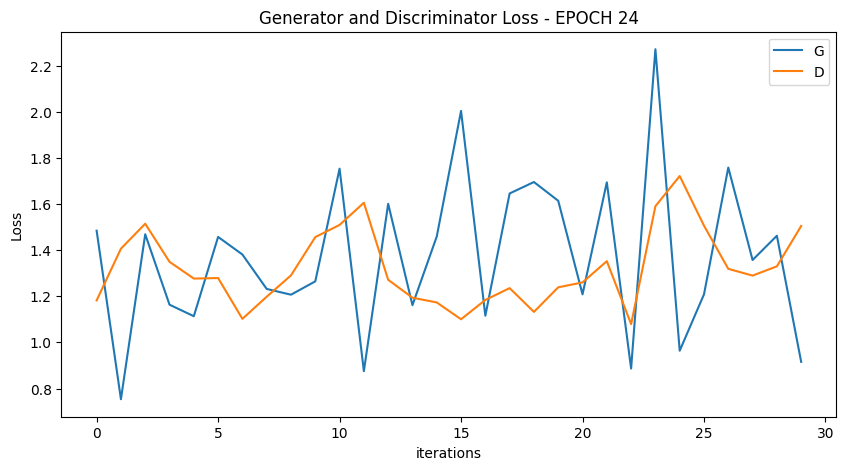

  0%|          | 0/30 [00:00<?, ?it/s]

[26/100][15/30] Loss_D: 1.3284 Loss_G: 0.9860 D(x): 0.3876 D(G(z)): 0.3090 / 0.3610
[26/100][30/30] Loss_D: 1.5006 Loss_G: 1.0625 D(x): 0.3905 D(G(z)): 0.4117 / 0.3417


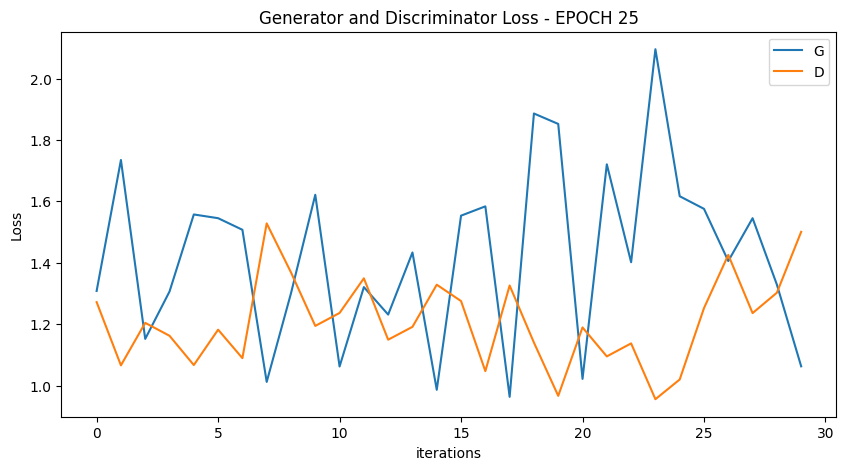

  0%|          | 0/30 [00:00<?, ?it/s]

[27/100][15/30] Loss_D: 1.3158 Loss_G: 1.4709 D(x): 0.5101 D(G(z)): 0.4273 / 0.2178
[27/100][30/30] Loss_D: 1.3671 Loss_G: 1.1255 D(x): 0.4571 D(G(z)): 0.4168 / 0.3247


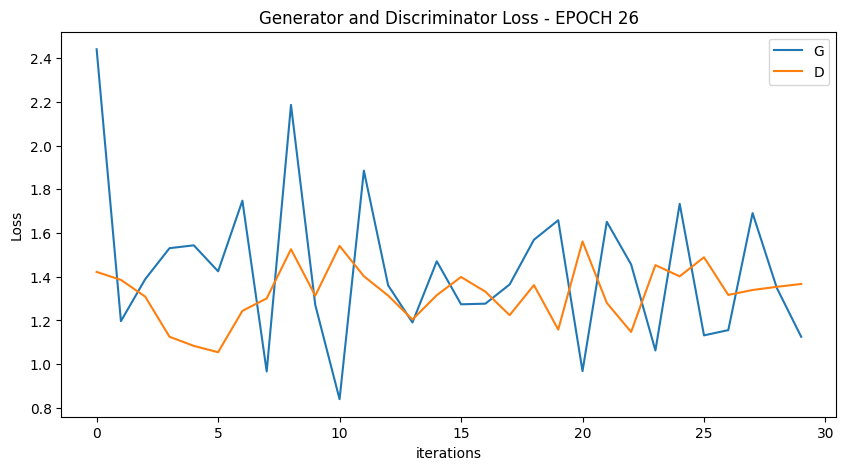

  0%|          | 0/30 [00:00<?, ?it/s]

[28/100][15/30] Loss_D: 1.2411 Loss_G: 1.5285 D(x): 0.5242 D(G(z)): 0.3926 / 0.2146
[28/100][30/30] Loss_D: 1.1777 Loss_G: 1.9719 D(x): 0.6675 D(G(z)): 0.4785 / 0.1253


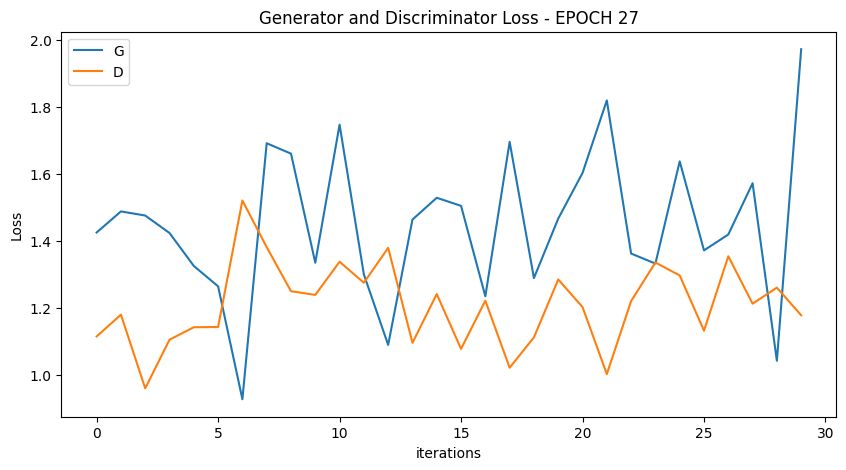

  0%|          | 0/30 [00:00<?, ?it/s]

[29/100][15/30] Loss_D: 1.1699 Loss_G: 2.0553 D(x): 0.6363 D(G(z)): 0.4474 / 0.1180
[29/100][30/30] Loss_D: 1.0457 Loss_G: 1.5080 D(x): 0.5324 D(G(z)): 0.3034 / 0.2136


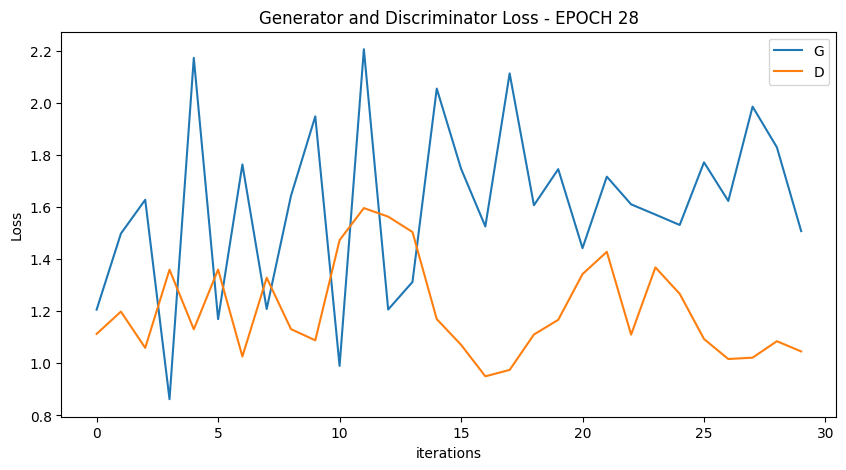

  0%|          | 0/30 [00:00<?, ?it/s]

[30/100][15/30] Loss_D: 1.2363 Loss_G: 1.4909 D(x): 0.5998 D(G(z)): 0.4627 / 0.2147
[30/100][30/30] Loss_D: 1.2253 Loss_G: 1.2686 D(x): 0.5324 D(G(z)): 0.3894 / 0.2797


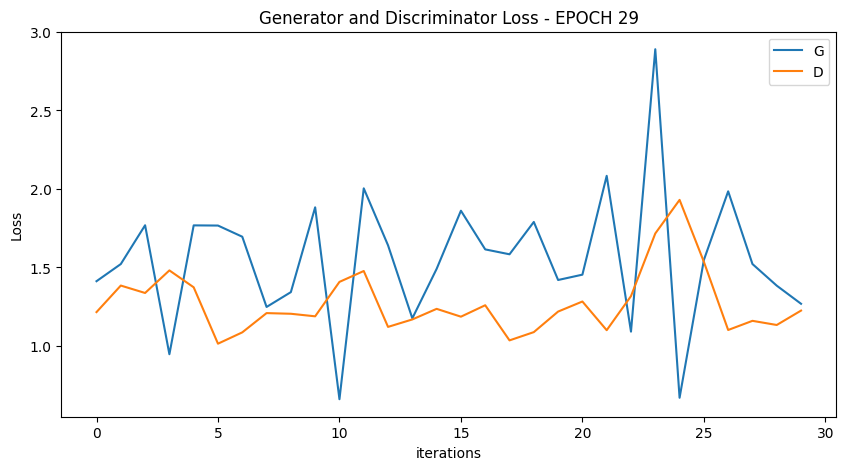

  0%|          | 0/30 [00:00<?, ?it/s]

[31/100][15/30] Loss_D: 1.3234 Loss_G: 1.3993 D(x): 0.5814 D(G(z)): 0.5021 / 0.2292
[31/100][30/30] Loss_D: 1.3809 Loss_G: 0.8465 D(x): 0.3404 D(G(z)): 0.2766 / 0.4292


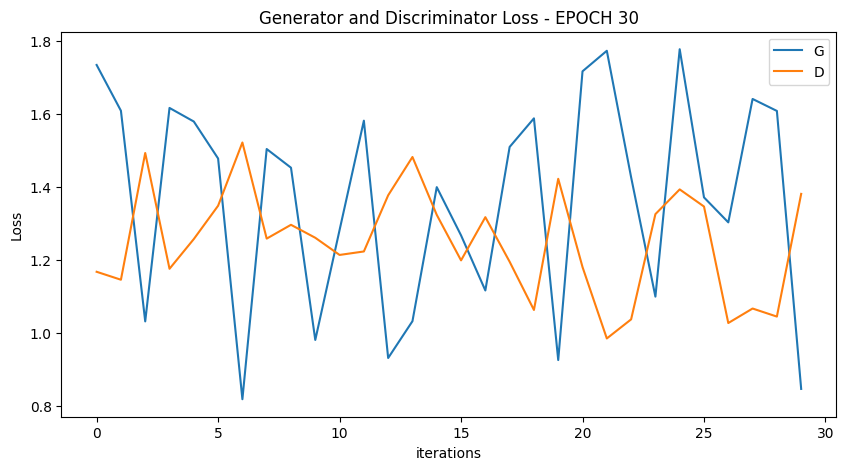

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


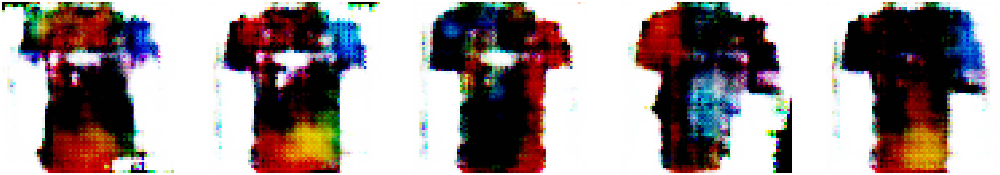

  0%|          | 0/30 [00:00<?, ?it/s]

[32/100][15/30] Loss_D: 1.2652 Loss_G: 1.4295 D(x): 0.4781 D(G(z)): 0.3798 / 0.2249
[32/100][30/30] Loss_D: 0.8692 Loss_G: 1.9195 D(x): 0.7166 D(G(z)): 0.3394 / 0.1344


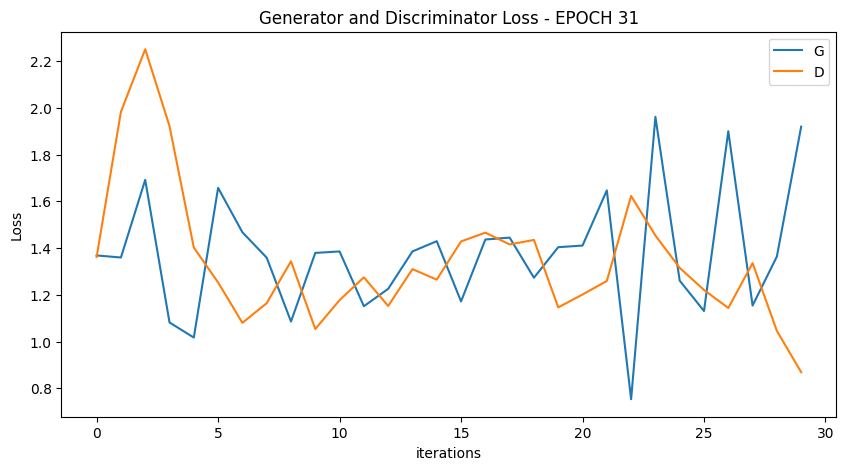

  0%|          | 0/30 [00:00<?, ?it/s]

[33/100][15/30] Loss_D: 1.1527 Loss_G: 1.2504 D(x): 0.5648 D(G(z)): 0.3989 / 0.2745
[33/100][30/30] Loss_D: 1.3376 Loss_G: 1.3725 D(x): 0.4140 D(G(z)): 0.3389 / 0.2538


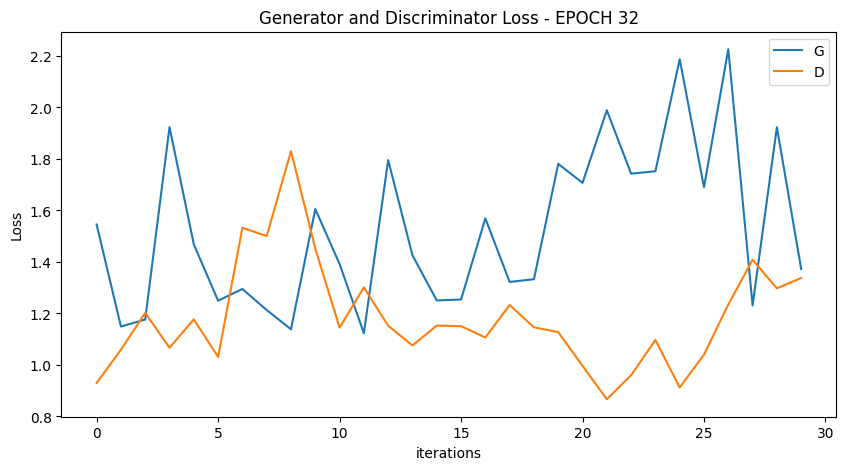

  0%|          | 0/30 [00:00<?, ?it/s]

[34/100][15/30] Loss_D: 1.4399 Loss_G: 1.2235 D(x): 0.4938 D(G(z)): 0.4977 / 0.2802
[34/100][30/30] Loss_D: 1.4567 Loss_G: 0.9794 D(x): 0.3935 D(G(z)): 0.3730 / 0.3736


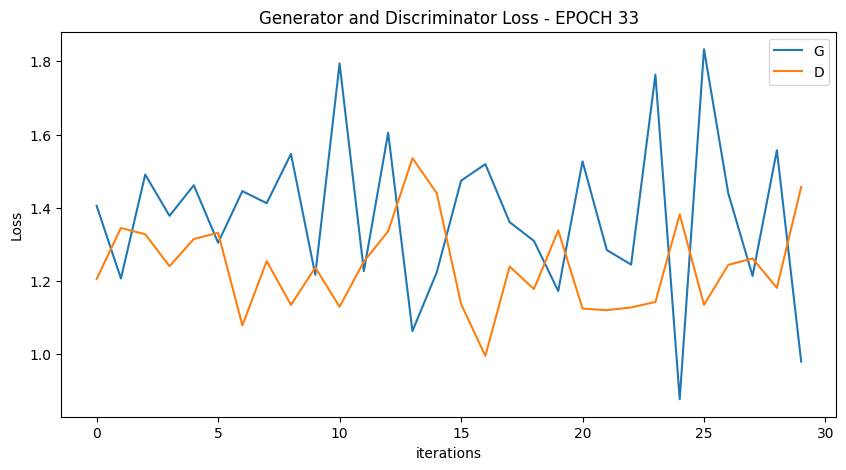

  0%|          | 0/30 [00:00<?, ?it/s]

[35/100][15/30] Loss_D: 1.2902 Loss_G: 1.1329 D(x): 0.4853 D(G(z)): 0.4026 / 0.3156
[35/100][30/30] Loss_D: 1.3280 Loss_G: 1.5964 D(x): 0.5839 D(G(z)): 0.4844 / 0.1873


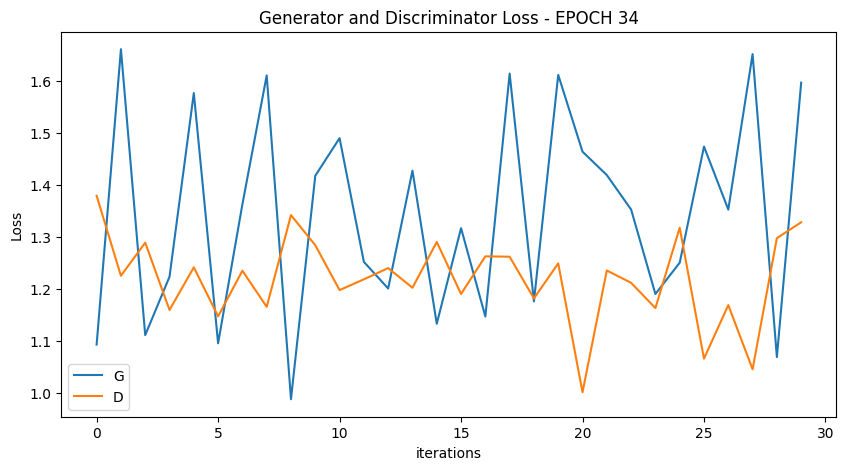

  0%|          | 0/30 [00:00<?, ?it/s]

[36/100][15/30] Loss_D: 1.3306 Loss_G: 1.0056 D(x): 0.3388 D(G(z)): 0.2130 / 0.3597
[36/100][30/30] Loss_D: 1.2051 Loss_G: 1.6900 D(x): 0.5665 D(G(z)): 0.4041 / 0.1885


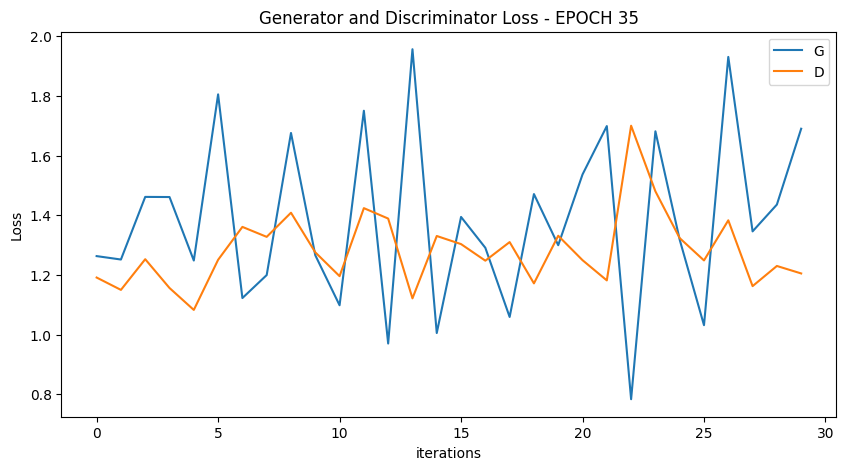

  0%|          | 0/30 [00:00<?, ?it/s]

[37/100][15/30] Loss_D: 1.2023 Loss_G: 1.5420 D(x): 0.6093 D(G(z)): 0.4578 / 0.1962
[37/100][30/30] Loss_D: 1.1118 Loss_G: 1.7248 D(x): 0.6828 D(G(z)): 0.4616 / 0.1629


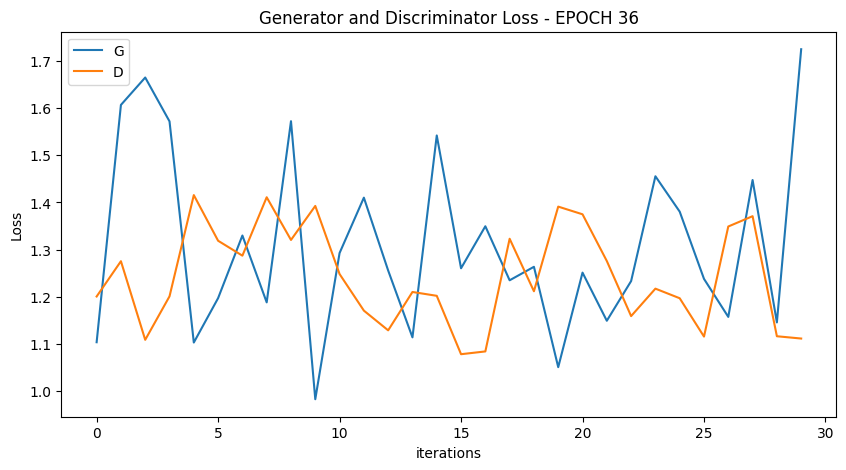

  0%|          | 0/30 [00:00<?, ?it/s]

[38/100][15/30] Loss_D: 1.6025 Loss_G: 1.0454 D(x): 0.4458 D(G(z)): 0.4959 / 0.3438
[38/100][30/30] Loss_D: 1.3009 Loss_G: 1.2747 D(x): 0.4150 D(G(z)): 0.2958 / 0.2725


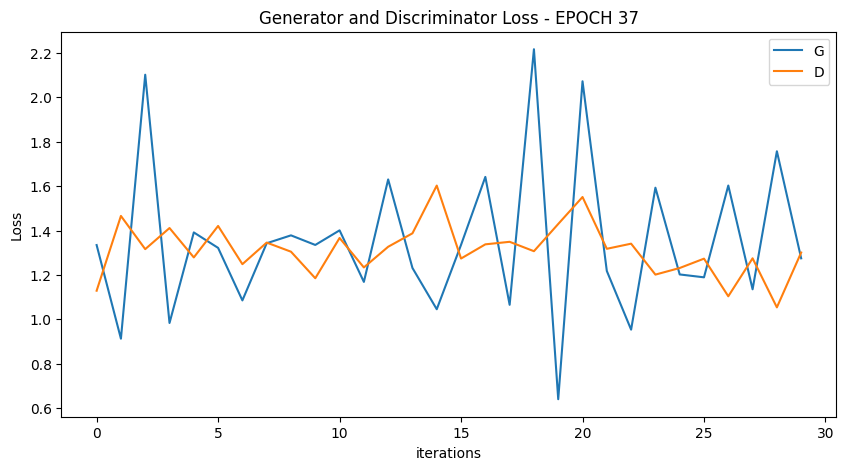

  0%|          | 0/30 [00:00<?, ?it/s]

[39/100][15/30] Loss_D: 1.3468 Loss_G: 1.4458 D(x): 0.5273 D(G(z)): 0.4666 / 0.2222
[39/100][30/30] Loss_D: 1.2161 Loss_G: 0.8458 D(x): 0.4126 D(G(z)): 0.2680 / 0.4437


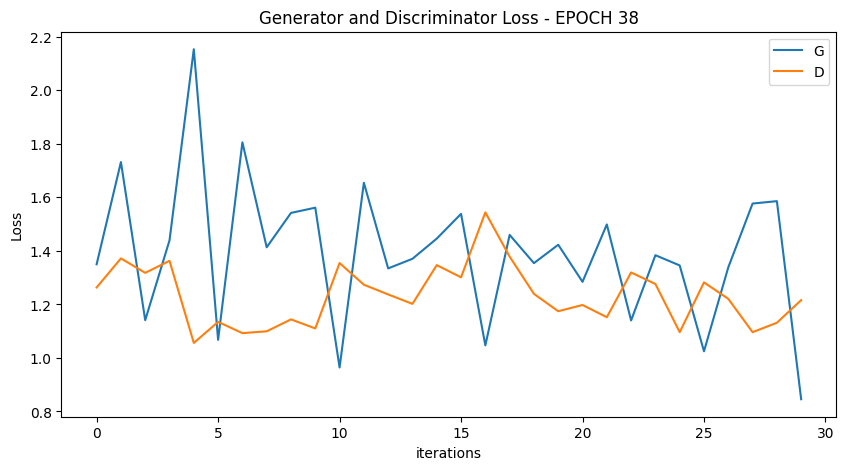

  0%|          | 0/30 [00:00<?, ?it/s]

[40/100][15/30] Loss_D: 1.4129 Loss_G: 1.2560 D(x): 0.4270 D(G(z)): 0.4205 / 0.2700
[40/100][30/30] Loss_D: 1.2761 Loss_G: 1.1022 D(x): 0.3969 D(G(z)): 0.2620 / 0.3285


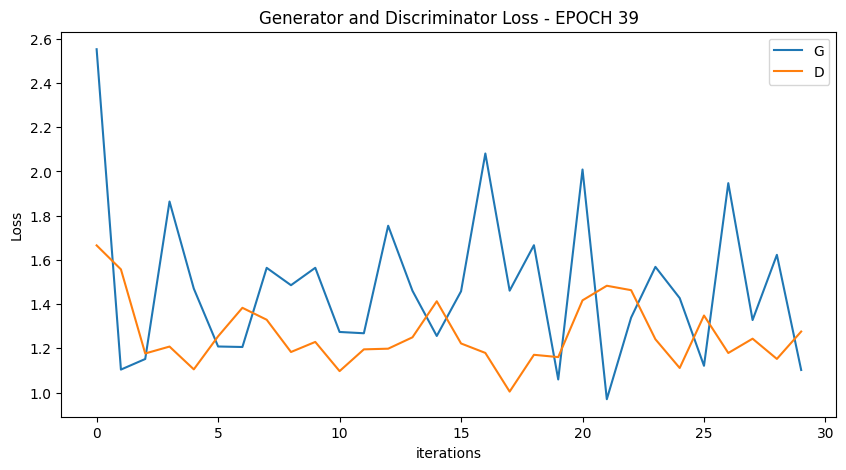

  0%|          | 0/30 [00:00<?, ?it/s]

[41/100][15/30] Loss_D: 1.4107 Loss_G: 1.3718 D(x): 0.3431 D(G(z)): 0.2836 / 0.2637
[41/100][30/30] Loss_D: 1.1521 Loss_G: 1.3590 D(x): 0.4962 D(G(z)): 0.3255 / 0.2377


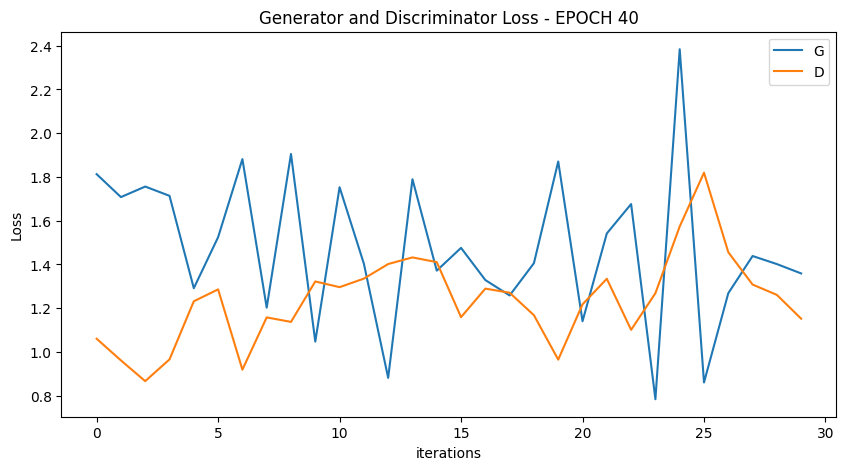

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


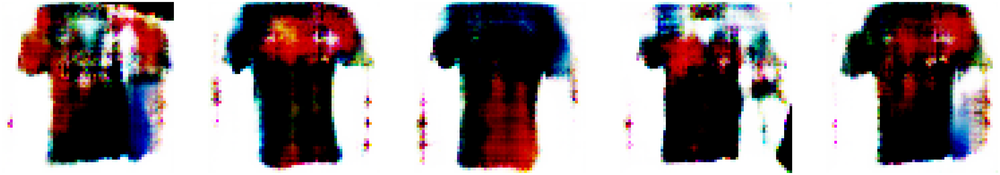

  0%|          | 0/30 [00:00<?, ?it/s]

[42/100][15/30] Loss_D: 1.1404 Loss_G: 1.5716 D(x): 0.6084 D(G(z)): 0.4240 / 0.2000
[42/100][30/30] Loss_D: 1.4448 Loss_G: 1.8231 D(x): 0.7107 D(G(z)): 0.6027 / 0.1509


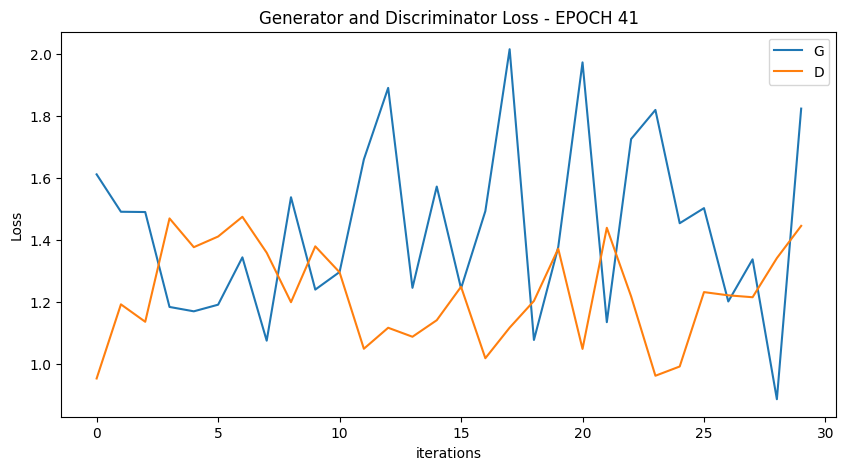

  0%|          | 0/30 [00:00<?, ?it/s]

[43/100][15/30] Loss_D: 1.1749 Loss_G: 1.3581 D(x): 0.5226 D(G(z)): 0.3548 / 0.2389
[43/100][30/30] Loss_D: 1.2613 Loss_G: 1.0066 D(x): 0.4253 D(G(z)): 0.2913 / 0.3711


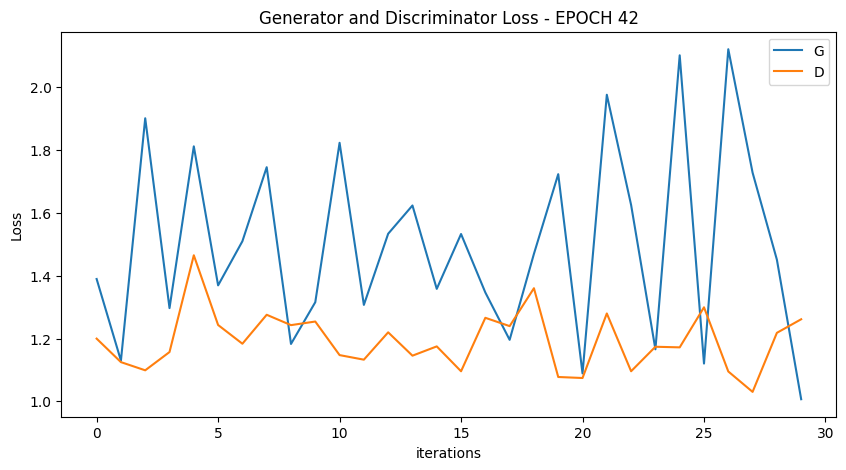

  0%|          | 0/30 [00:00<?, ?it/s]

[44/100][15/30] Loss_D: 1.2476 Loss_G: 1.2505 D(x): 0.4816 D(G(z)): 0.3343 / 0.2938
[44/100][30/30] Loss_D: 1.3038 Loss_G: 1.4010 D(x): 0.4689 D(G(z)): 0.3742 / 0.2413


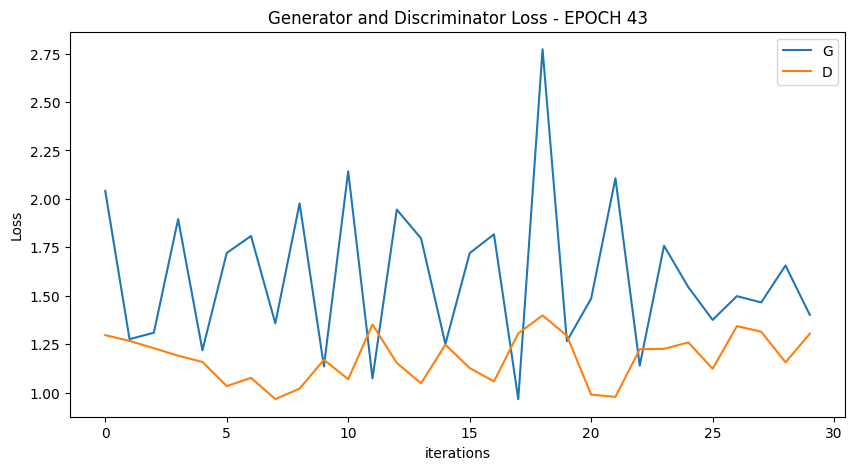

  0%|          | 0/30 [00:00<?, ?it/s]

[45/100][15/30] Loss_D: 1.1818 Loss_G: 1.1626 D(x): 0.4554 D(G(z)): 0.2923 / 0.3028
[45/100][30/30] Loss_D: 1.3210 Loss_G: 1.3853 D(x): 0.4213 D(G(z)): 0.3238 / 0.2554


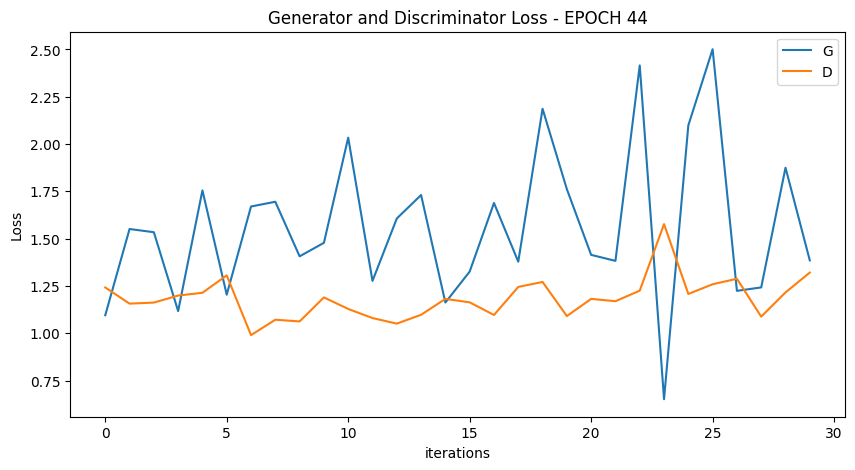

  0%|          | 0/30 [00:00<?, ?it/s]

[46/100][15/30] Loss_D: 1.0454 Loss_G: 1.4171 D(x): 0.5107 D(G(z)): 0.2726 / 0.2500
[46/100][30/30] Loss_D: 1.0828 Loss_G: 2.5876 D(x): 0.5946 D(G(z)): 0.3778 / 0.0725


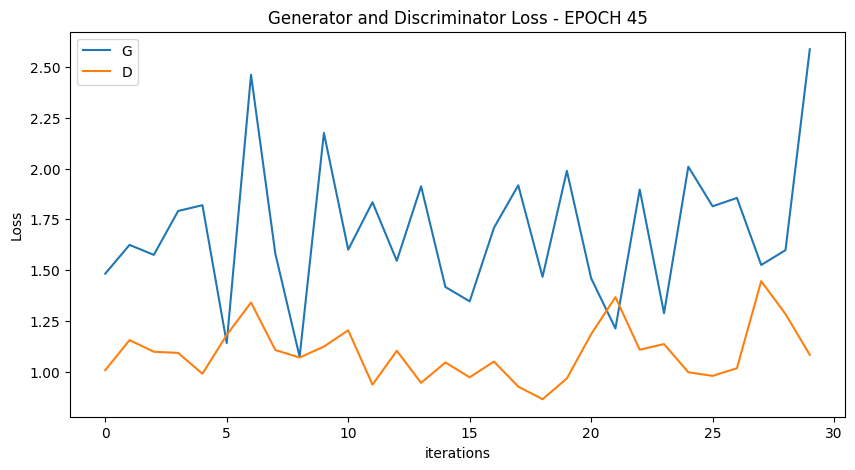

  0%|          | 0/30 [00:00<?, ?it/s]

[47/100][15/30] Loss_D: 0.9610 Loss_G: 1.6129 D(x): 0.6402 D(G(z)): 0.3419 / 0.1920
[47/100][30/30] Loss_D: 1.0295 Loss_G: 2.1904 D(x): 0.6468 D(G(z)): 0.3731 / 0.1094


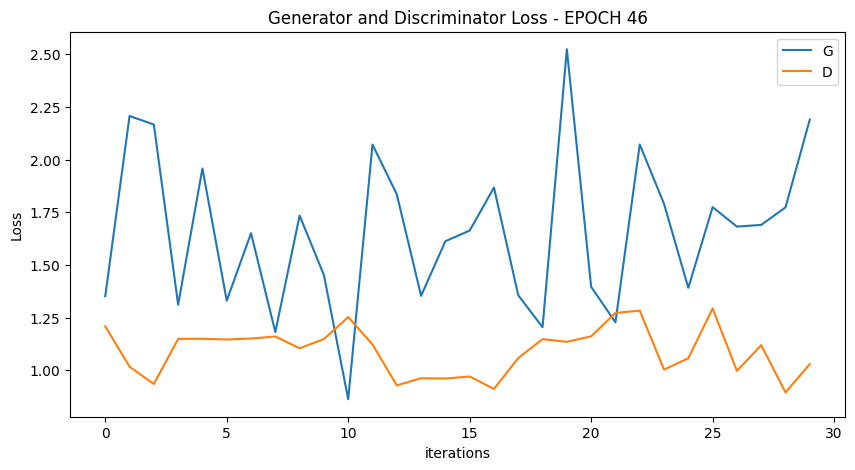

  0%|          | 0/30 [00:00<?, ?it/s]

[48/100][15/30] Loss_D: 0.8662 Loss_G: 2.4557 D(x): 0.6819 D(G(z)): 0.3007 / 0.0785
[48/100][30/30] Loss_D: 1.0712 Loss_G: 1.8507 D(x): 0.5674 D(G(z)): 0.3311 / 0.1579


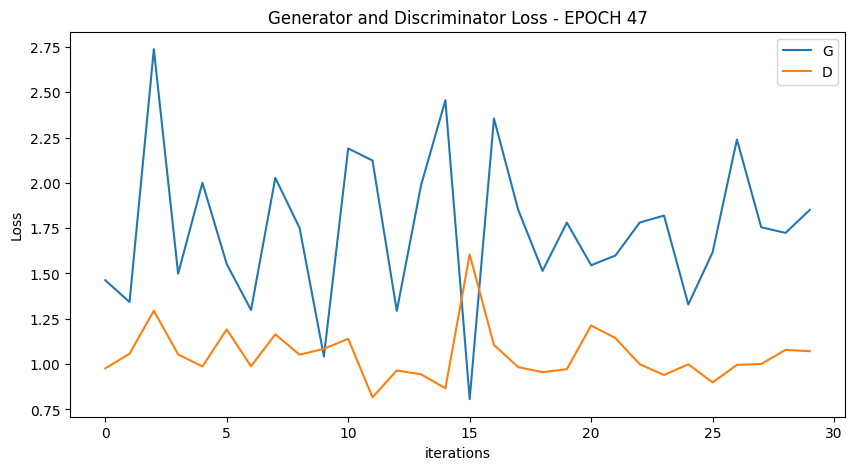

  0%|          | 0/30 [00:00<?, ?it/s]

[49/100][15/30] Loss_D: 0.8064 Loss_G: 1.8352 D(x): 0.5985 D(G(z)): 0.1840 / 0.1473
[49/100][30/30] Loss_D: 0.9836 Loss_G: 1.9588 D(x): 0.6006 D(G(z)): 0.3034 / 0.1315


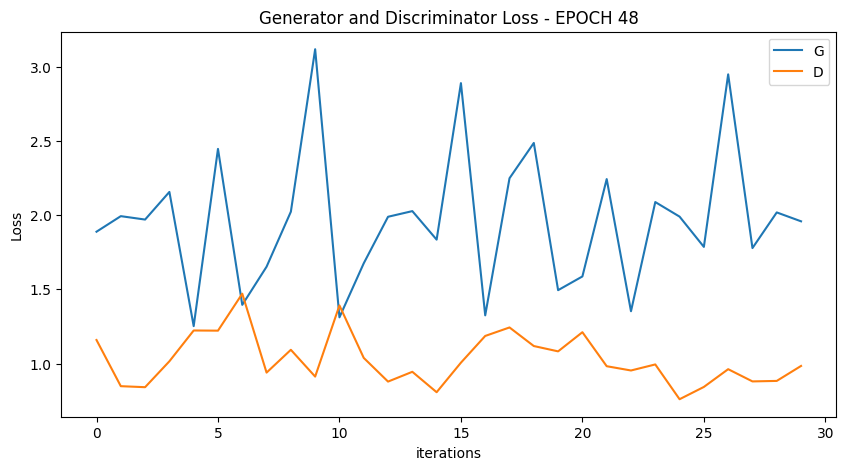

  0%|          | 0/30 [00:00<?, ?it/s]

[50/100][15/30] Loss_D: 0.9529 Loss_G: 1.5268 D(x): 0.5269 D(G(z)): 0.2155 / 0.2273
[50/100][30/30] Loss_D: 1.2643 Loss_G: 1.9103 D(x): 0.5776 D(G(z)): 0.4362 / 0.1468


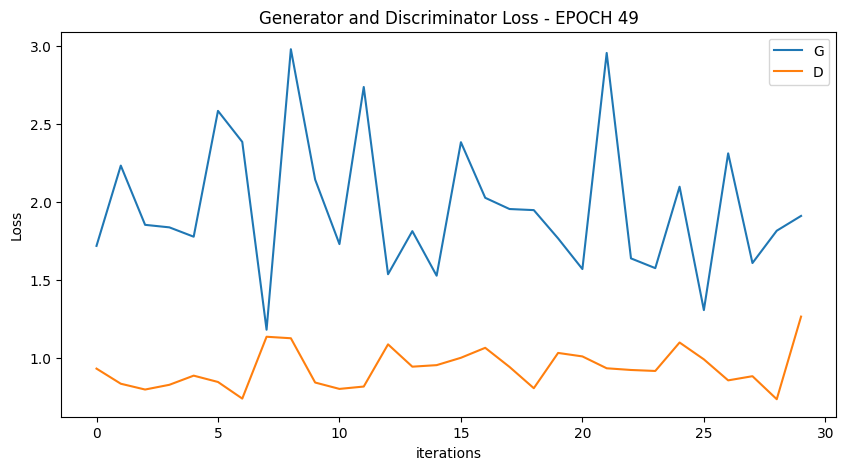

  0%|          | 0/30 [00:00<?, ?it/s]

[51/100][15/30] Loss_D: 0.8038 Loss_G: 2.5100 D(x): 0.7679 D(G(z)): 0.3022 / 0.0816
[51/100][30/30] Loss_D: 0.9537 Loss_G: 1.9511 D(x): 0.7023 D(G(z)): 0.3618 / 0.1365


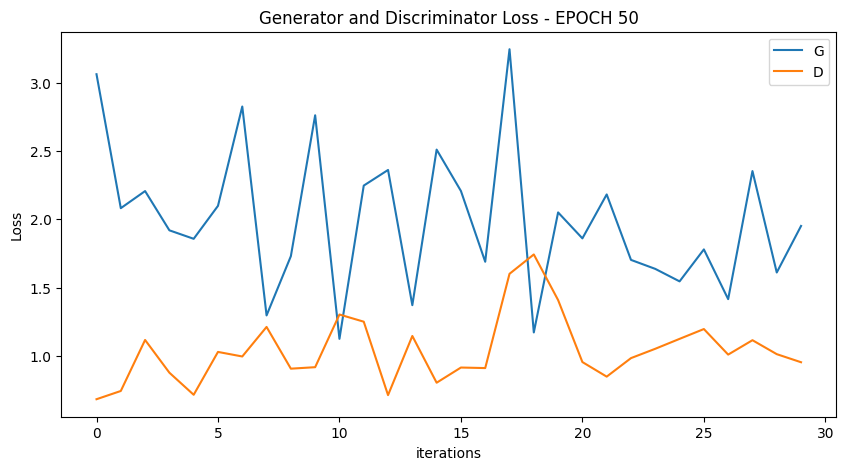

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


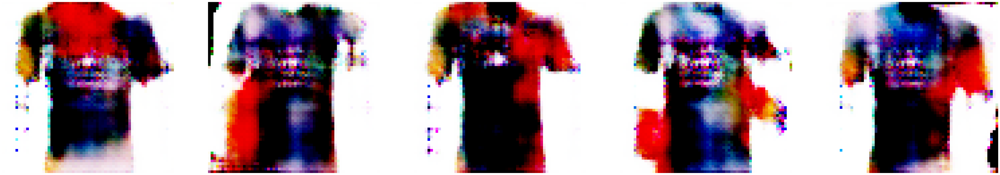

  0%|          | 0/30 [00:00<?, ?it/s]

[52/100][15/30] Loss_D: 1.0670 Loss_G: 1.3370 D(x): 0.4249 D(G(z)): 0.1154 / 0.2898
[52/100][30/30] Loss_D: 0.7839 Loss_G: 2.7542 D(x): 0.7736 D(G(z)): 0.2959 / 0.0612


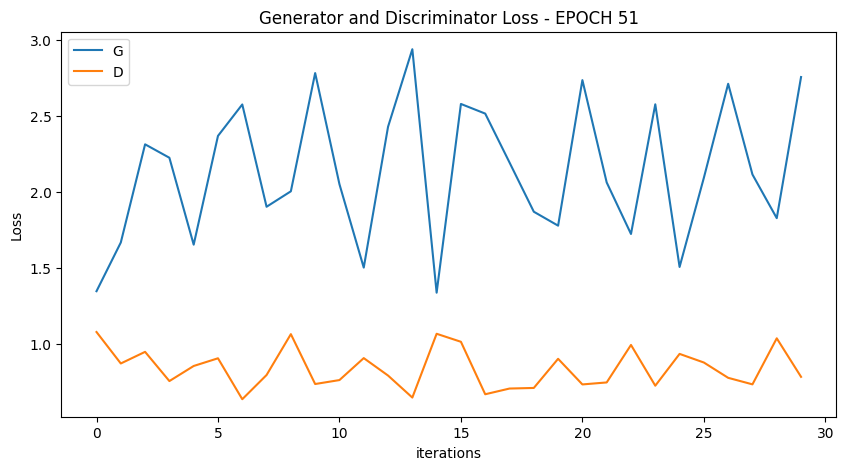

  0%|          | 0/30 [00:00<?, ?it/s]

[53/100][15/30] Loss_D: 1.0164 Loss_G: 1.2413 D(x): 0.5435 D(G(z)): 0.2441 / 0.2896
[53/100][30/30] Loss_D: 1.1370 Loss_G: 1.7517 D(x): 0.5664 D(G(z)): 0.3487 / 0.2068


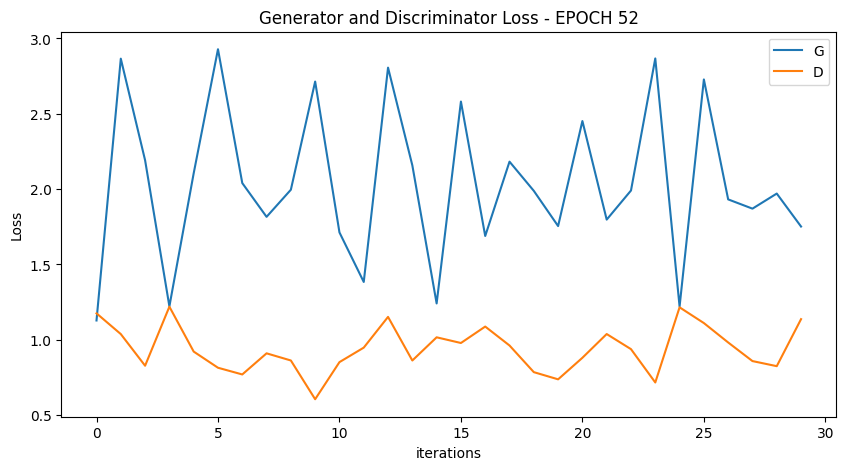

  0%|          | 0/30 [00:00<?, ?it/s]

[54/100][15/30] Loss_D: 0.6394 Loss_G: 2.7780 D(x): 0.7424 D(G(z)): 0.1715 / 0.0558
[54/100][30/30] Loss_D: 0.9235 Loss_G: 2.0891 D(x): 0.5497 D(G(z)): 0.2082 / 0.1425


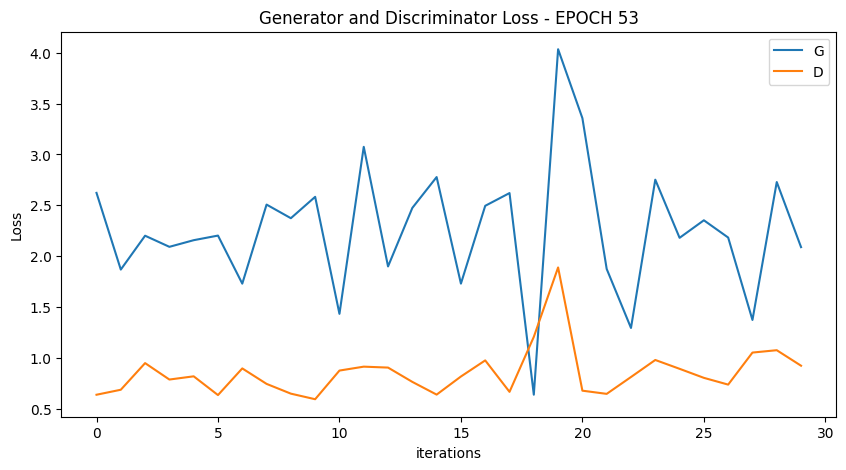

  0%|          | 0/30 [00:00<?, ?it/s]

[55/100][15/30] Loss_D: 1.1279 Loss_G: 1.2661 D(x): 0.5041 D(G(z)): 0.2797 / 0.3356
[55/100][30/30] Loss_D: 0.6711 Loss_G: 2.4657 D(x): 0.8250 D(G(z)): 0.2497 / 0.0737


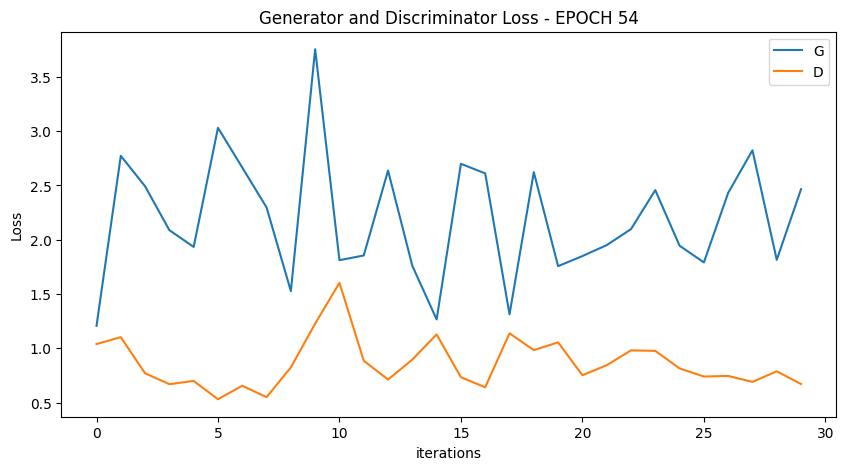

  0%|          | 0/30 [00:00<?, ?it/s]

[56/100][15/30] Loss_D: 0.5252 Loss_G: 2.7302 D(x): 0.8297 D(G(z)): 0.1509 / 0.0713
[56/100][30/30] Loss_D: 0.6948 Loss_G: 2.9936 D(x): 0.5835 D(G(z)): 0.0259 / 0.0577


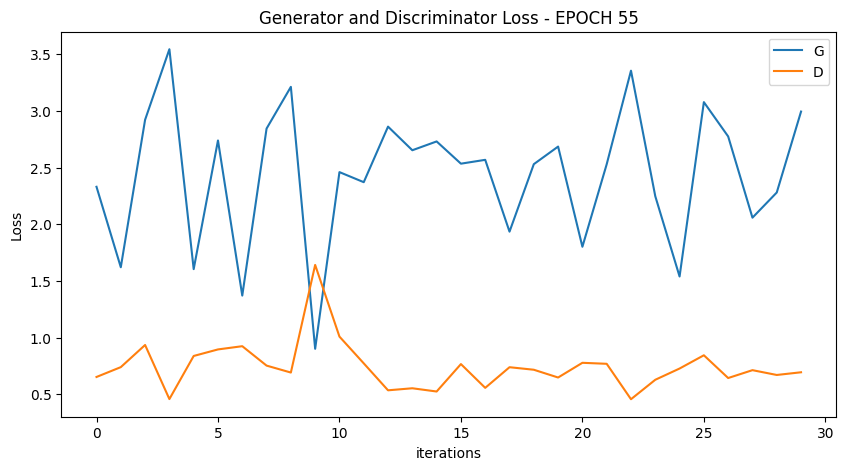

  0%|          | 0/30 [00:00<?, ?it/s]

[57/100][15/30] Loss_D: 0.8602 Loss_G: 2.4328 D(x): 0.4855 D(G(z)): 0.0433 / 0.1050
[57/100][30/30] Loss_D: 0.9923 Loss_G: 2.9956 D(x): 0.9358 D(G(z)): 0.4349 / 0.0455


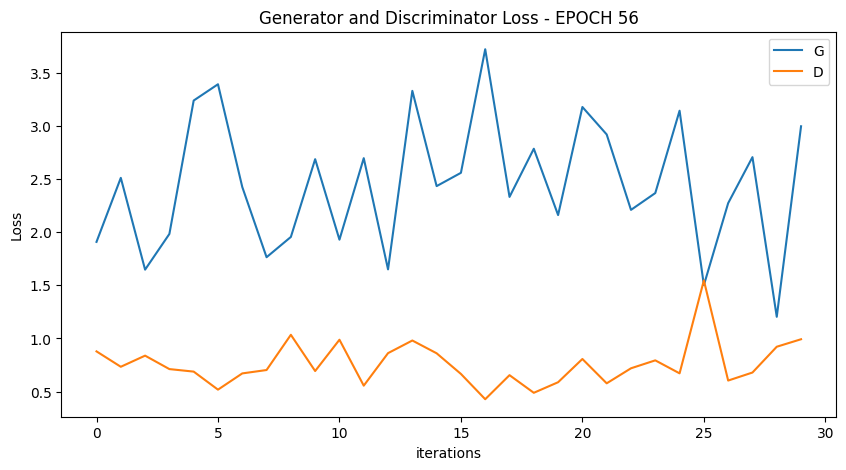

  0%|          | 0/30 [00:00<?, ?it/s]

[58/100][15/30] Loss_D: 0.5788 Loss_G: 2.2948 D(x): 0.7894 D(G(z)): 0.1335 / 0.1012
[58/100][30/30] Loss_D: 1.0976 Loss_G: 3.8656 D(x): 0.9489 D(G(z)): 0.4870 / 0.0223


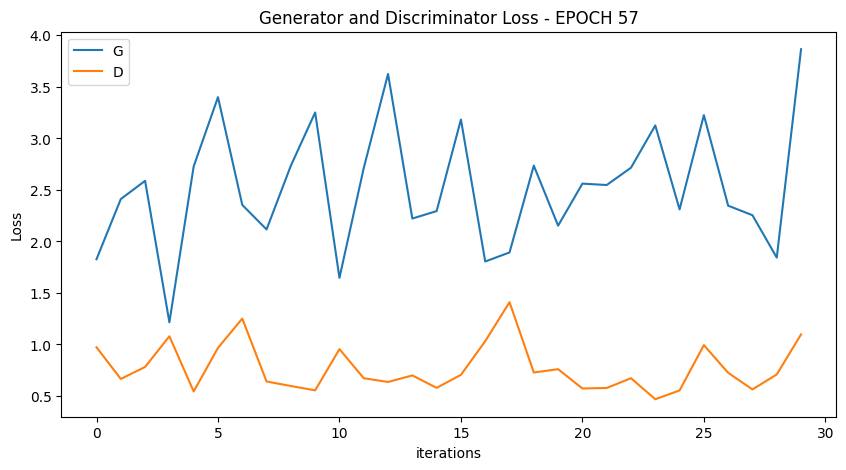

  0%|          | 0/30 [00:00<?, ?it/s]

[59/100][15/30] Loss_D: 1.4910 Loss_G: 2.7824 D(x): 0.9207 D(G(z)): 0.5835 / 0.0663
[59/100][30/30] Loss_D: 0.6053 Loss_G: 1.9898 D(x): 0.6465 D(G(z)): 0.0533 / 0.1360


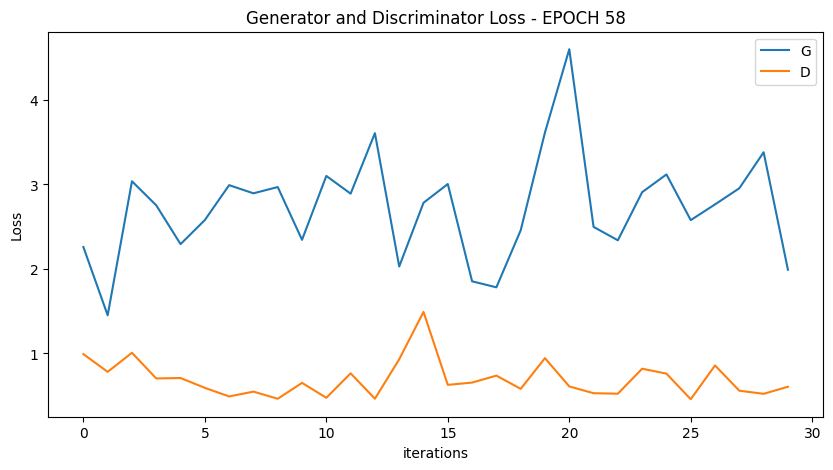

  0%|          | 0/30 [00:00<?, ?it/s]

[60/100][15/30] Loss_D: 0.7917 Loss_G: 2.1386 D(x): 0.6990 D(G(z)): 0.2507 / 0.1244
[60/100][30/30] Loss_D: 0.8007 Loss_G: 3.1564 D(x): 0.8254 D(G(z)): 0.3368 / 0.0439


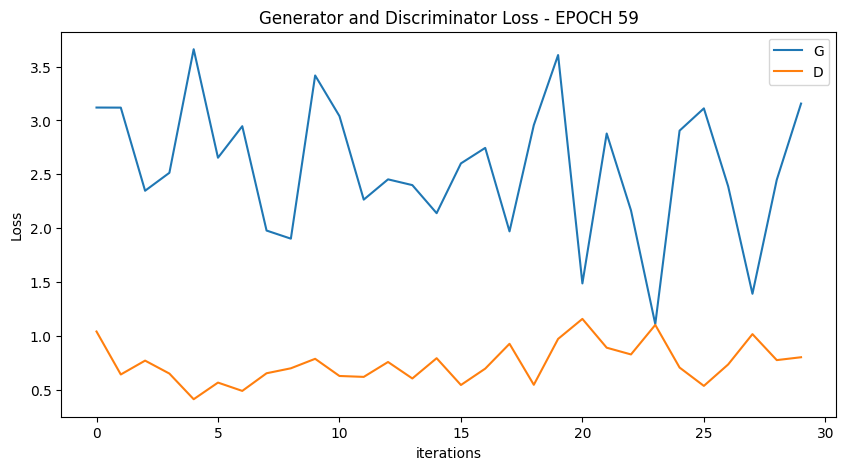

  0%|          | 0/30 [00:00<?, ?it/s]

[61/100][15/30] Loss_D: 0.3903 Loss_G: 3.0532 D(x): 0.8810 D(G(z)): 0.0459 / 0.0542
[61/100][30/30] Loss_D: 0.4988 Loss_G: 3.0876 D(x): 0.7503 D(G(z)): 0.0686 / 0.0510


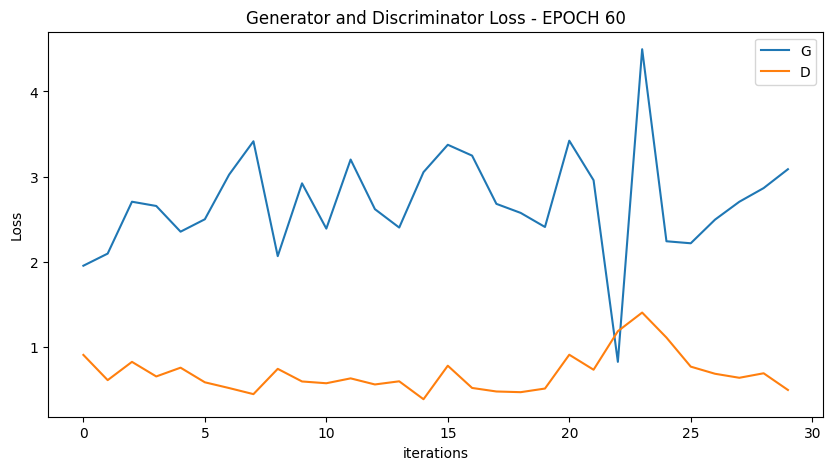

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


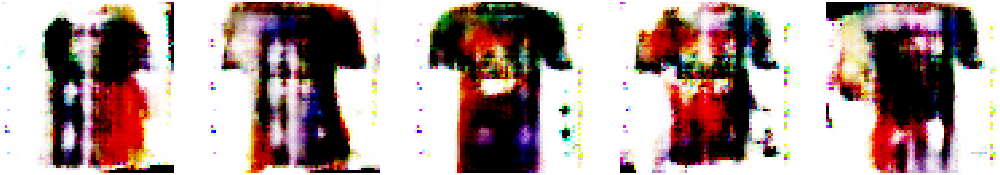

  0%|          | 0/30 [00:00<?, ?it/s]

[62/100][15/30] Loss_D: 1.1510 Loss_G: 2.4632 D(x): 0.7127 D(G(z)): 0.4569 / 0.0936
[62/100][30/30] Loss_D: 0.9419 Loss_G: 1.8421 D(x): 0.4525 D(G(z)): 0.1008 / 0.1787


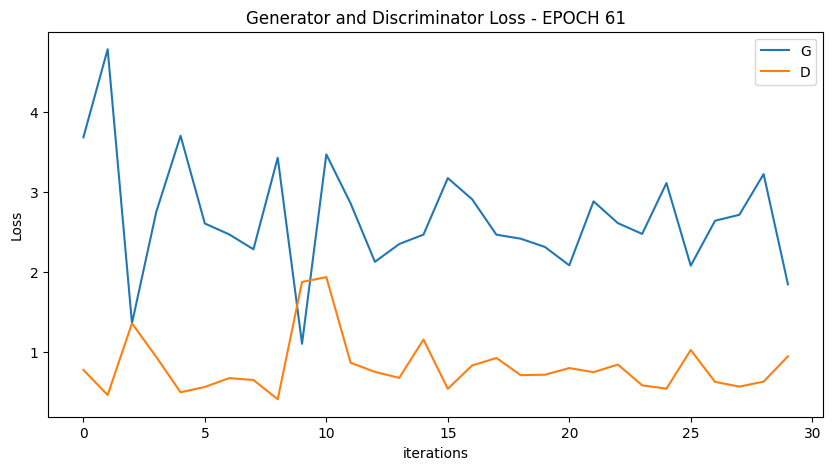

  0%|          | 0/30 [00:00<?, ?it/s]

[63/100][15/30] Loss_D: 0.4338 Loss_G: 3.2741 D(x): 0.8346 D(G(z)): 0.0702 / 0.0395
[63/100][30/30] Loss_D: 0.8975 Loss_G: 1.4275 D(x): 0.5004 D(G(z)): 0.1156 / 0.2389


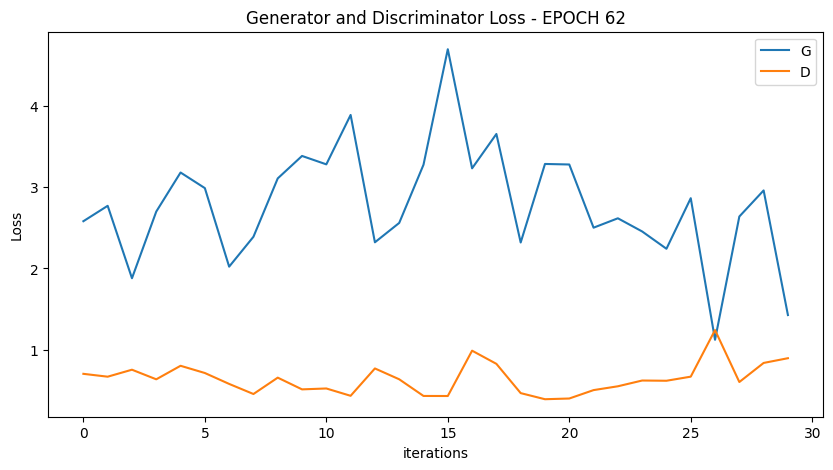

  0%|          | 0/30 [00:00<?, ?it/s]

[64/100][15/30] Loss_D: 0.6063 Loss_G: 3.2746 D(x): 0.6204 D(G(z)): 0.0240 / 0.0362
[64/100][30/30] Loss_D: 0.5753 Loss_G: 2.9061 D(x): 0.7748 D(G(z)): 0.1477 / 0.0556


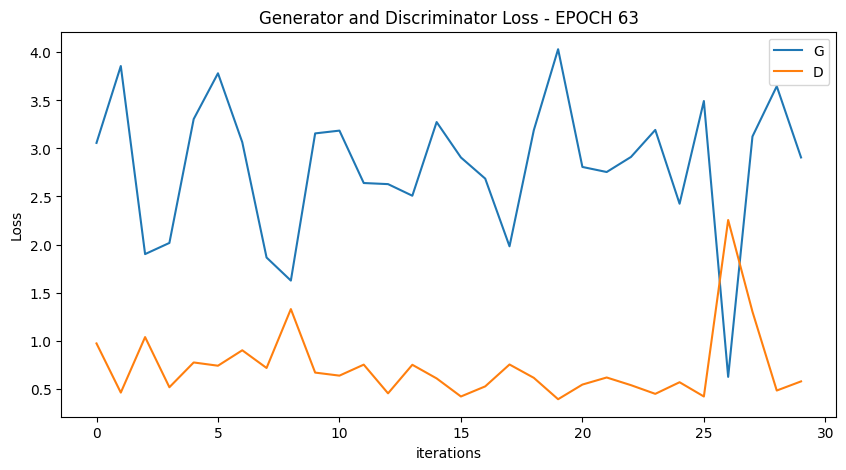

  0%|          | 0/30 [00:00<?, ?it/s]

[65/100][15/30] Loss_D: 0.6799 Loss_G: 2.1210 D(x): 0.5784 D(G(z)): 0.0672 / 0.1180
[65/100][30/30] Loss_D: 0.8500 Loss_G: 2.5807 D(x): 0.5468 D(G(z)): 0.0380 / 0.0794


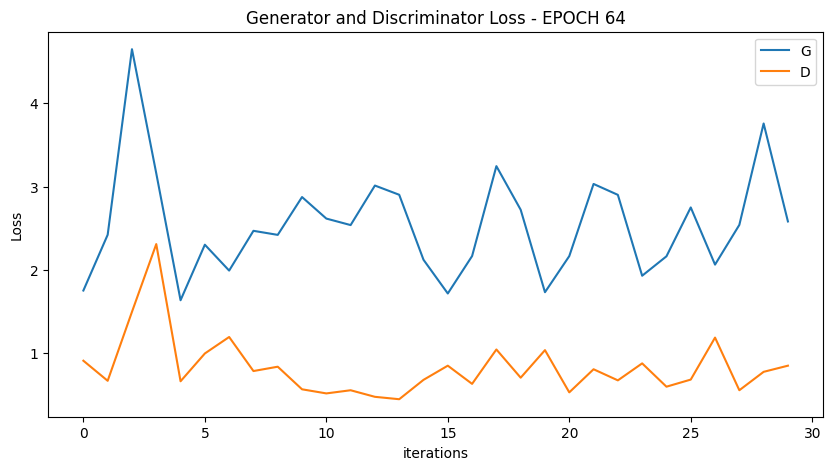

  0%|          | 0/30 [00:00<?, ?it/s]

[66/100][15/30] Loss_D: 0.6757 Loss_G: 2.9571 D(x): 0.8599 D(G(z)): 0.2471 / 0.0498
[66/100][30/30] Loss_D: 0.3860 Loss_G: 4.1239 D(x): 0.8674 D(G(z)): 0.0427 / 0.0131


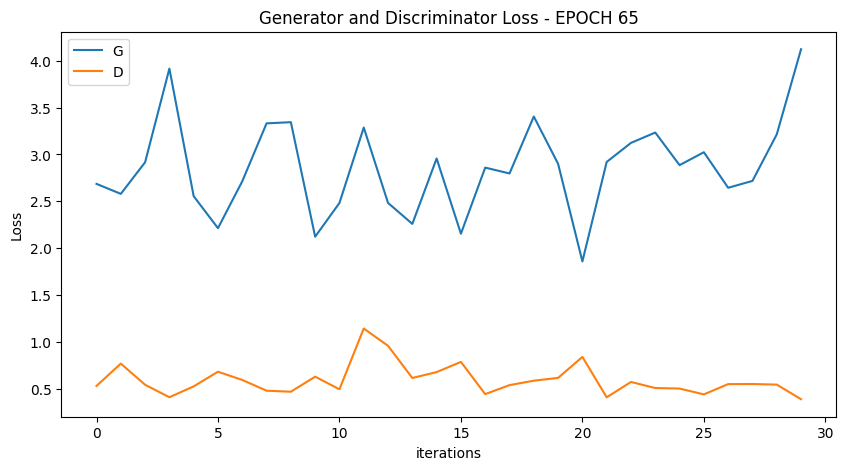

  0%|          | 0/30 [00:00<?, ?it/s]

[67/100][15/30] Loss_D: 0.5157 Loss_G: 2.7960 D(x): 0.7430 D(G(z)): 0.0570 / 0.0581
[67/100][30/30] Loss_D: 0.6778 Loss_G: 2.7870 D(x): 0.5679 D(G(z)): 0.0431 / 0.0704


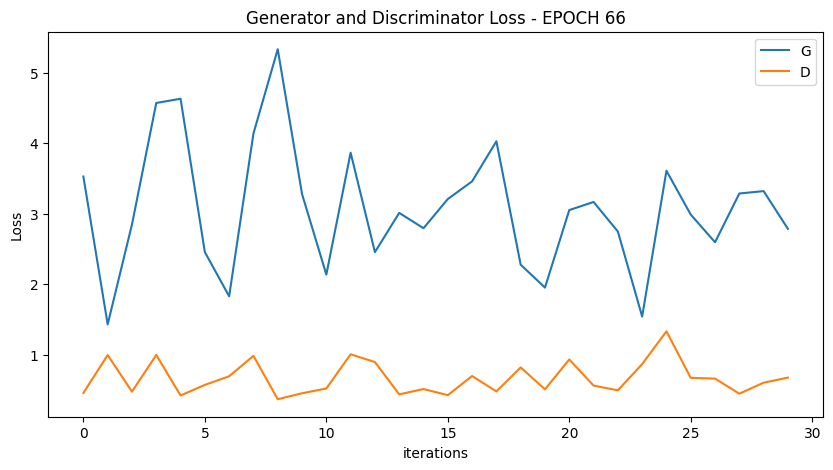

  0%|          | 0/30 [00:00<?, ?it/s]

[68/100][15/30] Loss_D: 1.1413 Loss_G: 3.8249 D(x): 0.8534 D(G(z)): 0.4394 / 0.0317
[68/100][30/30] Loss_D: 0.4997 Loss_G: 4.7386 D(x): 0.7042 D(G(z)): 0.0090 / 0.0089


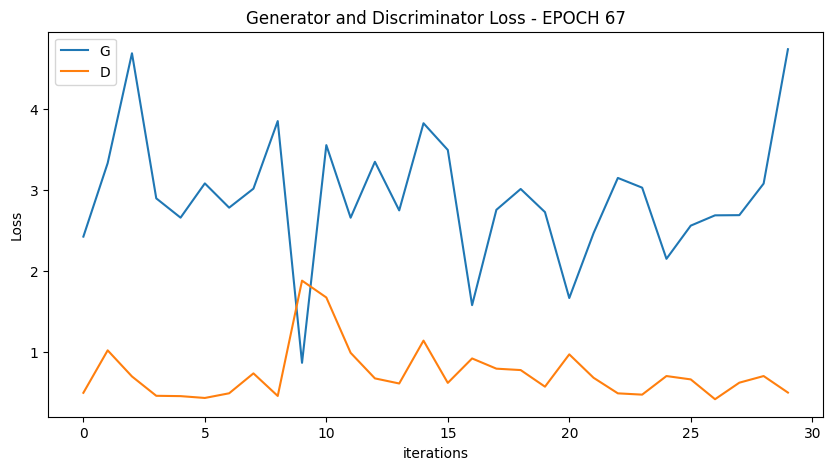

  0%|          | 0/30 [00:00<?, ?it/s]

[69/100][15/30] Loss_D: 0.8906 Loss_G: 3.6648 D(x): 0.4662 D(G(z)): 0.0096 / 0.0365
[69/100][30/30] Loss_D: 0.6119 Loss_G: 3.6454 D(x): 0.5988 D(G(z)): 0.0177 / 0.0273


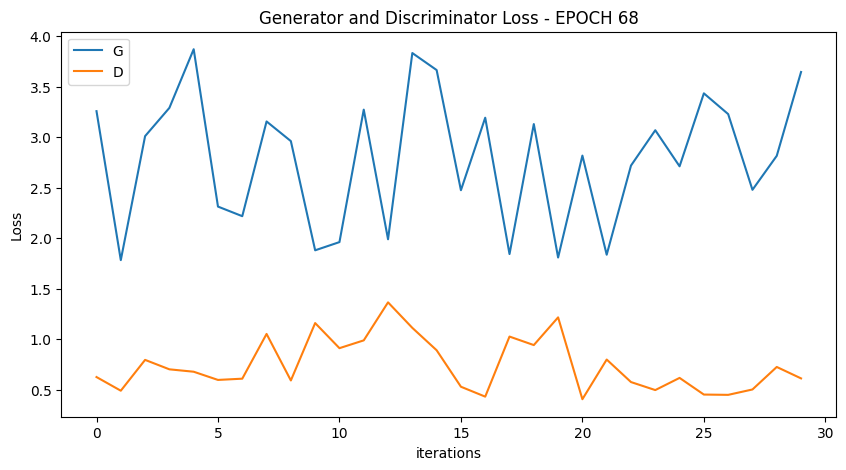

  0%|          | 0/30 [00:00<?, ?it/s]

[70/100][15/30] Loss_D: 0.4166 Loss_G: 3.3190 D(x): 0.8395 D(G(z)): 0.0416 / 0.0397
[70/100][30/30] Loss_D: 0.4967 Loss_G: 2.8232 D(x): 0.8597 D(G(z)): 0.1169 / 0.0616


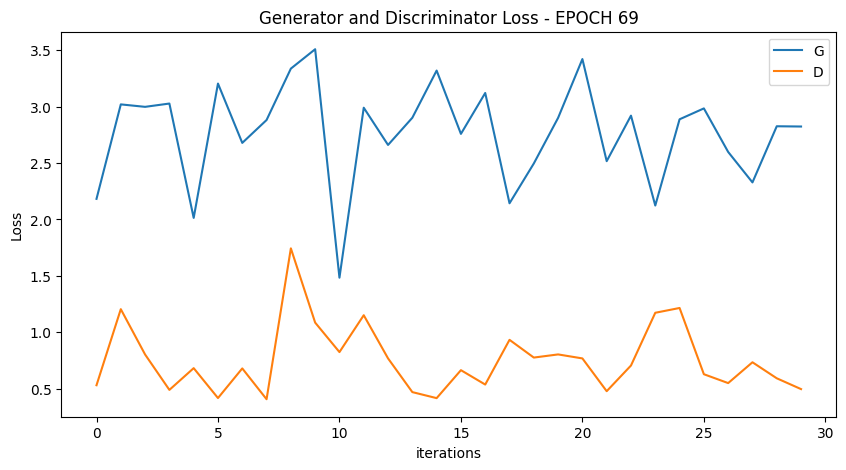

  0%|          | 0/30 [00:00<?, ?it/s]

[71/100][15/30] Loss_D: 0.6400 Loss_G: 2.4591 D(x): 0.6162 D(G(z)): 0.0652 / 0.0893
[71/100][30/30] Loss_D: 0.6186 Loss_G: 2.7594 D(x): 0.7032 D(G(z)): 0.1324 / 0.0588


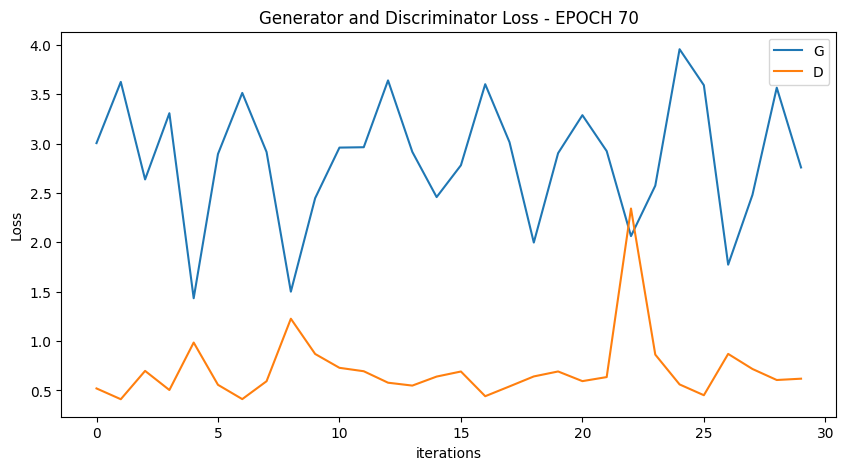

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


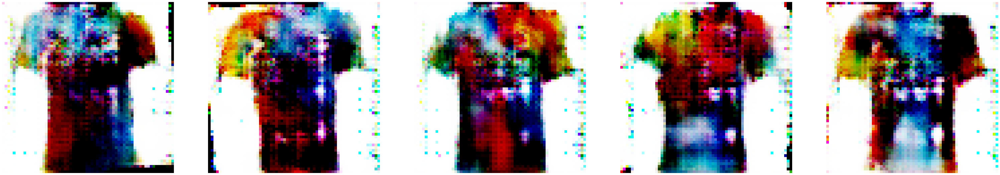

  0%|          | 0/30 [00:00<?, ?it/s]

[72/100][15/30] Loss_D: 1.0250 Loss_G: 3.8727 D(x): 0.8104 D(G(z)): 0.4512 / 0.0186
[72/100][30/30] Loss_D: 0.7444 Loss_G: 2.9170 D(x): 0.6745 D(G(z)): 0.1834 / 0.0634


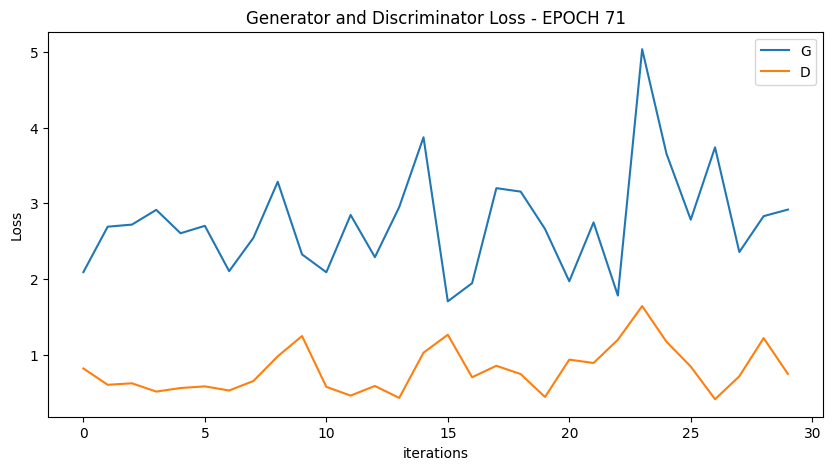

  0%|          | 0/30 [00:00<?, ?it/s]

[73/100][15/30] Loss_D: 0.9102 Loss_G: 1.8118 D(x): 0.4425 D(G(z)): 0.0350 / 0.1883
[73/100][30/30] Loss_D: 0.7252 Loss_G: 2.4556 D(x): 0.9378 D(G(z)): 0.2809 / 0.0798


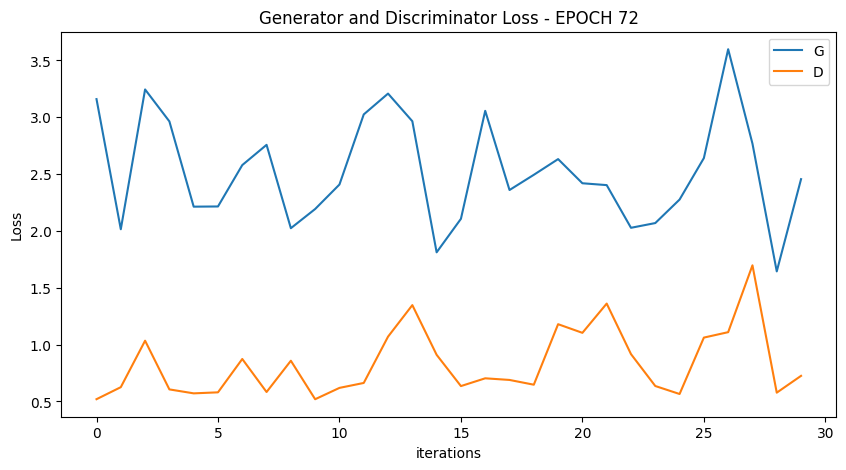

  0%|          | 0/30 [00:00<?, ?it/s]

[74/100][15/30] Loss_D: 0.4921 Loss_G: 3.0147 D(x): 0.7285 D(G(z)): 0.0433 / 0.0568
[74/100][30/30] Loss_D: 0.5623 Loss_G: 2.2205 D(x): 0.8208 D(G(z)): 0.1648 / 0.1169


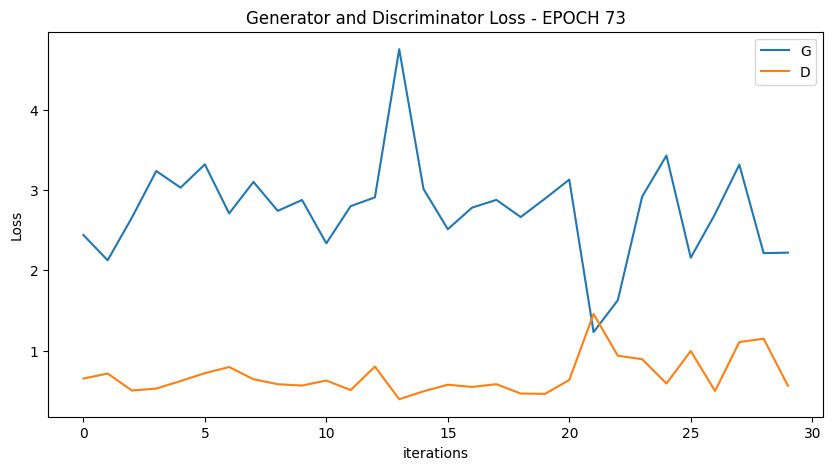

  0%|          | 0/30 [00:00<?, ?it/s]

[75/100][15/30] Loss_D: 0.6889 Loss_G: 2.0521 D(x): 0.6145 D(G(z)): 0.0916 / 0.1503
[75/100][30/30] Loss_D: 0.5071 Loss_G: 3.9020 D(x): 0.6830 D(G(z)): 0.0233 / 0.0174


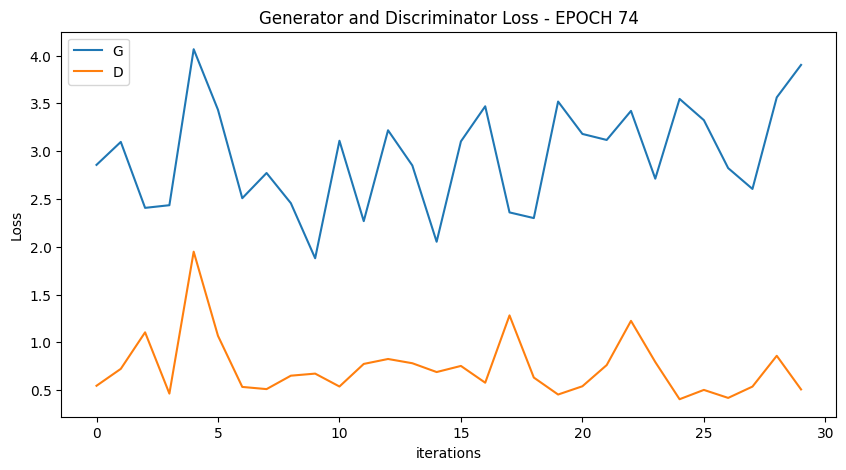

  0%|          | 0/30 [00:00<?, ?it/s]

[76/100][15/30] Loss_D: 0.4732 Loss_G: 2.6014 D(x): 0.7888 D(G(z)): 0.0824 / 0.0735
[76/100][30/30] Loss_D: 0.5345 Loss_G: 2.4136 D(x): 0.9004 D(G(z)): 0.1137 / 0.0861


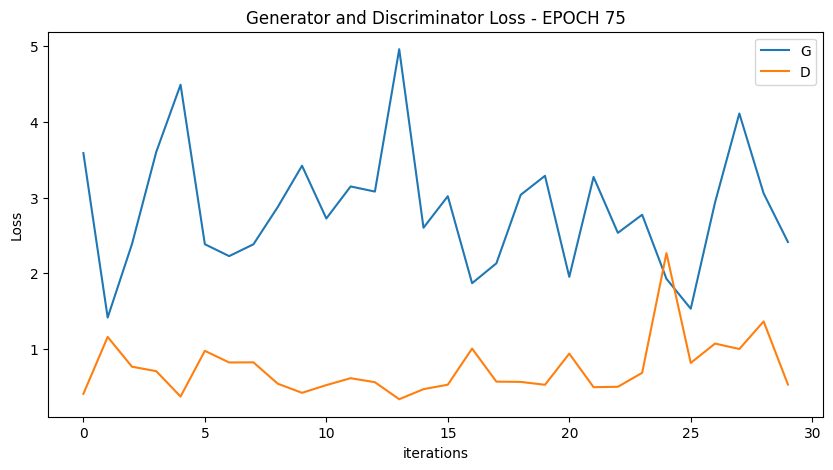

  0%|          | 0/30 [00:00<?, ?it/s]

[77/100][15/30] Loss_D: 0.5613 Loss_G: 2.6221 D(x): 0.8611 D(G(z)): 0.1857 / 0.0688
[77/100][30/30] Loss_D: 0.3925 Loss_G: 4.3790 D(x): 0.8091 D(G(z)): 0.0194 / 0.0114


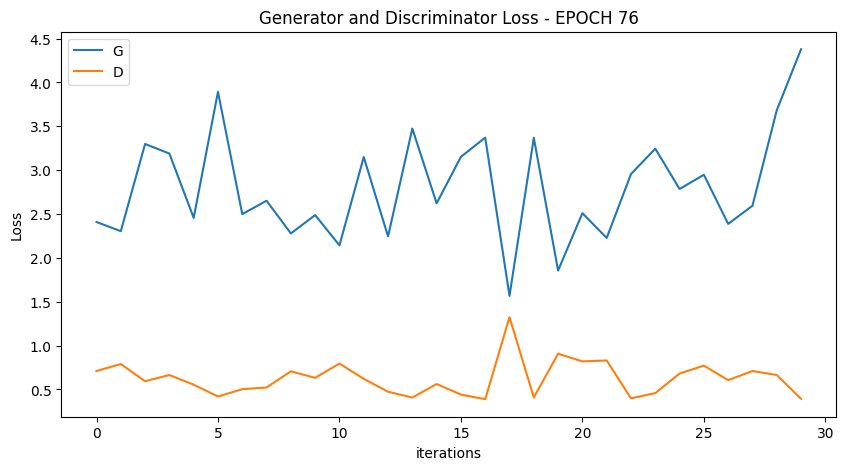

  0%|          | 0/30 [00:00<?, ?it/s]

[78/100][15/30] Loss_D: 1.0807 Loss_G: 3.0184 D(x): 0.9438 D(G(z)): 0.4828 / 0.0522
[78/100][30/30] Loss_D: 0.8317 Loss_G: 2.1116 D(x): 0.6440 D(G(z)): 0.2261 / 0.1183


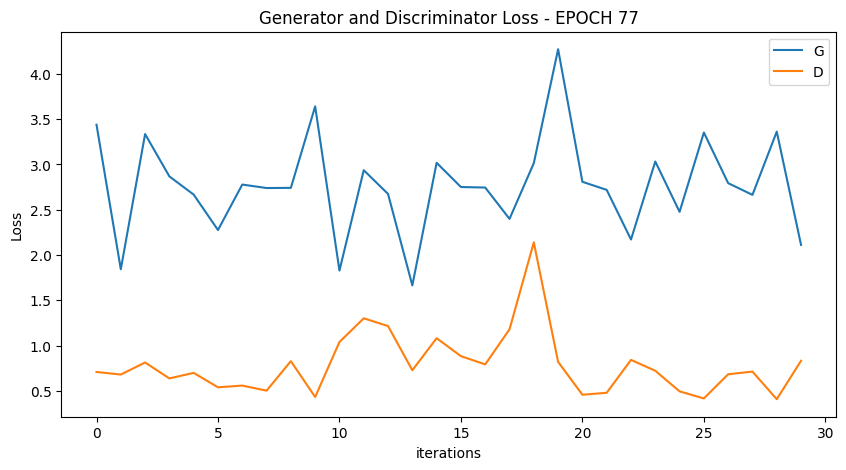

  0%|          | 0/30 [00:00<?, ?it/s]

[79/100][15/30] Loss_D: 0.6337 Loss_G: 2.4179 D(x): 0.7080 D(G(z)): 0.1326 / 0.0894
[79/100][30/30] Loss_D: 1.3334 Loss_G: 3.5666 D(x): 0.2738 D(G(z)): 0.0162 / 0.0225


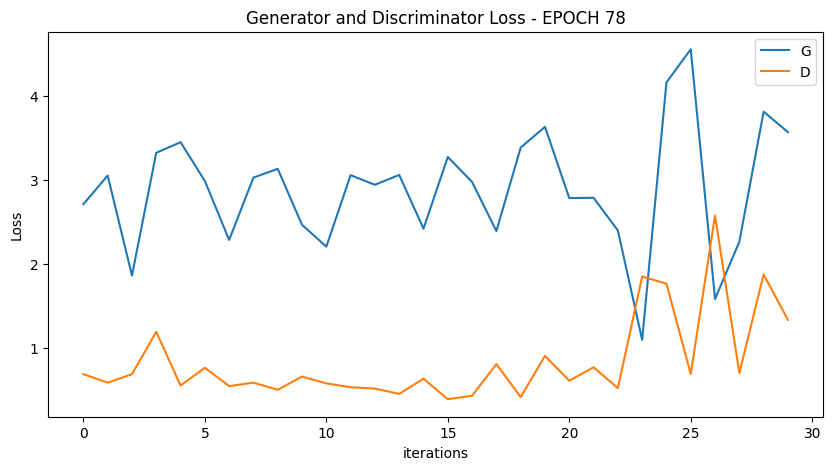

  0%|          | 0/30 [00:00<?, ?it/s]

[80/100][15/30] Loss_D: 0.7826 Loss_G: 4.1123 D(x): 0.4885 D(G(z)): 0.0055 / 0.0141
[80/100][30/30] Loss_D: 0.3580 Loss_G: 3.6197 D(x): 0.8905 D(G(z)): 0.0241 / 0.0260


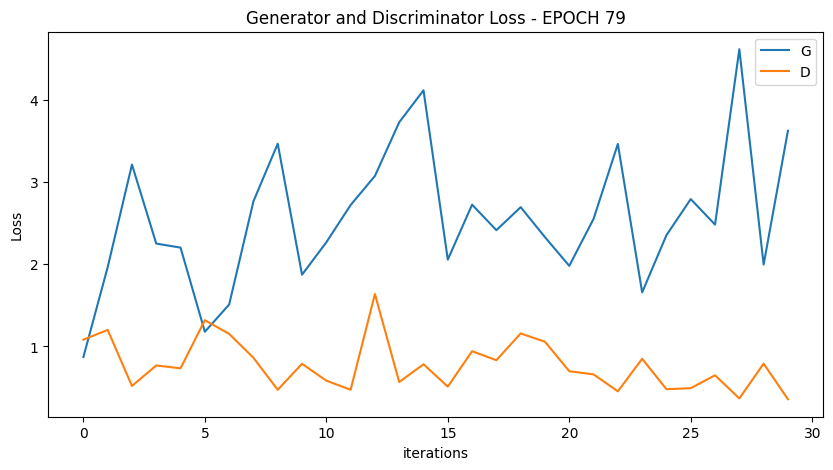

  0%|          | 0/30 [00:00<?, ?it/s]

[81/100][15/30] Loss_D: 0.4205 Loss_G: 3.3272 D(x): 0.9445 D(G(z)): 0.0575 / 0.0315
[81/100][30/30] Loss_D: 1.6134 Loss_G: 1.7447 D(x): 0.2124 D(G(z)): 0.0278 / 0.1987


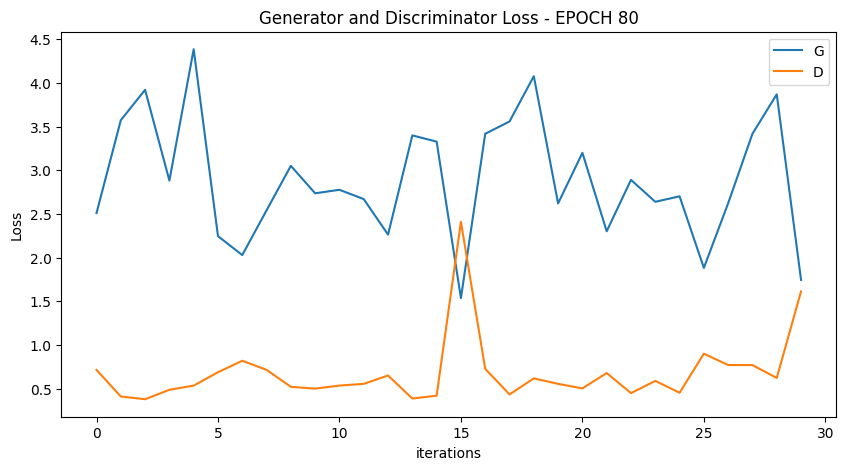

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


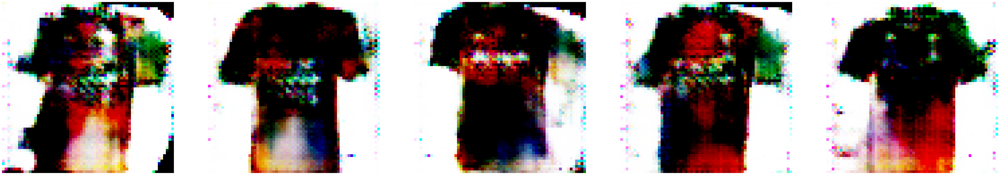

  0%|          | 0/30 [00:00<?, ?it/s]

[82/100][15/30] Loss_D: 0.5367 Loss_G: 2.7202 D(x): 0.8658 D(G(z)): 0.1730 / 0.0647
[82/100][30/30] Loss_D: 0.8894 Loss_G: 2.6223 D(x): 0.8374 D(G(z)): 0.3561 / 0.0772


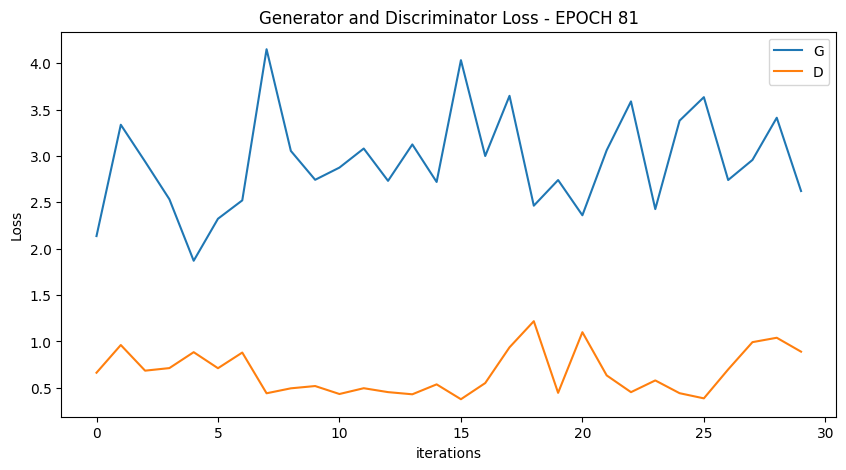

  0%|          | 0/30 [00:00<?, ?it/s]

[83/100][15/30] Loss_D: 0.7523 Loss_G: 3.6135 D(x): 0.9456 D(G(z)): 0.2964 / 0.0255
[83/100][30/30] Loss_D: 0.5774 Loss_G: 3.0230 D(x): 0.8521 D(G(z)): 0.1892 / 0.0409


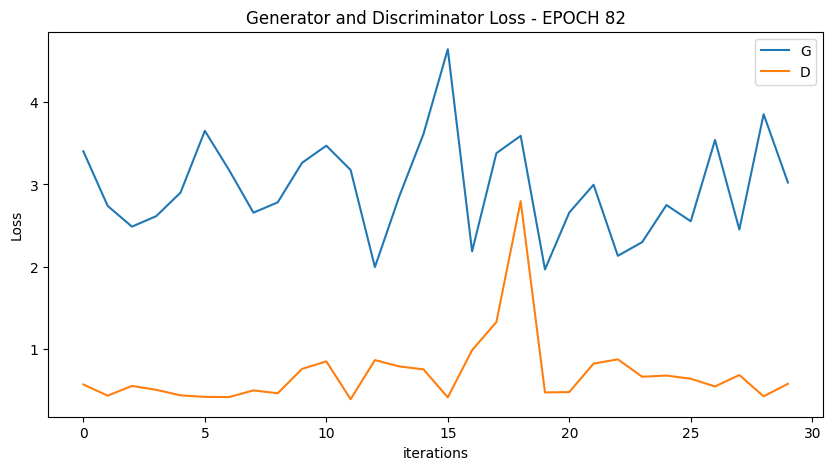

  0%|          | 0/30 [00:00<?, ?it/s]

[84/100][15/30] Loss_D: 0.4989 Loss_G: 2.6752 D(x): 0.9107 D(G(z)): 0.1406 / 0.0630
[84/100][30/30] Loss_D: 0.5429 Loss_G: 2.6747 D(x): 0.9726 D(G(z)): 0.1210 / 0.0694


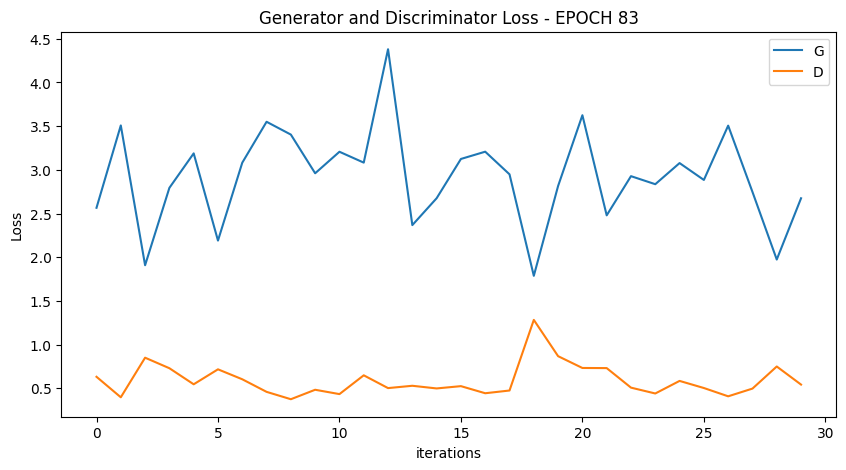

  0%|          | 0/30 [00:00<?, ?it/s]

[85/100][15/30] Loss_D: 0.4221 Loss_G: 4.2407 D(x): 0.7799 D(G(z)): 0.0232 / 0.0150
[85/100][30/30] Loss_D: 0.4612 Loss_G: 3.4239 D(x): 0.7638 D(G(z)): 0.0214 / 0.0331


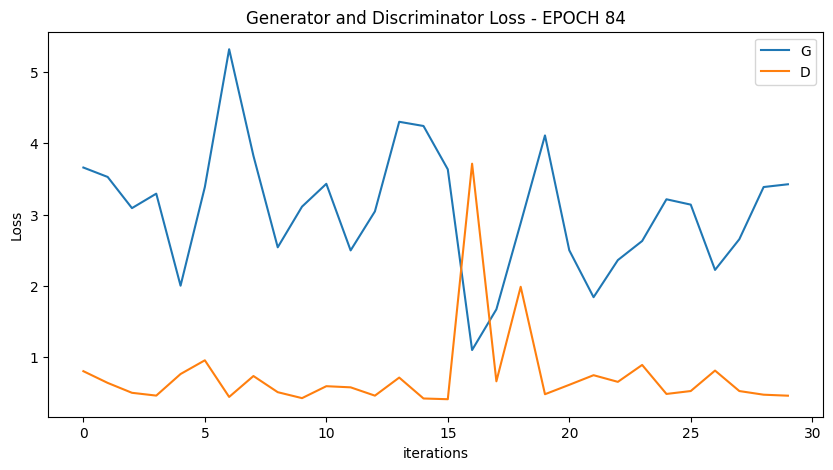

  0%|          | 0/30 [00:00<?, ?it/s]

[86/100][15/30] Loss_D: 1.9641 Loss_G: 3.3700 D(x): 0.9698 D(G(z)): 0.7454 / 0.0428
[86/100][30/30] Loss_D: 0.4887 Loss_G: 3.0794 D(x): 0.7407 D(G(z)): 0.0651 / 0.0420


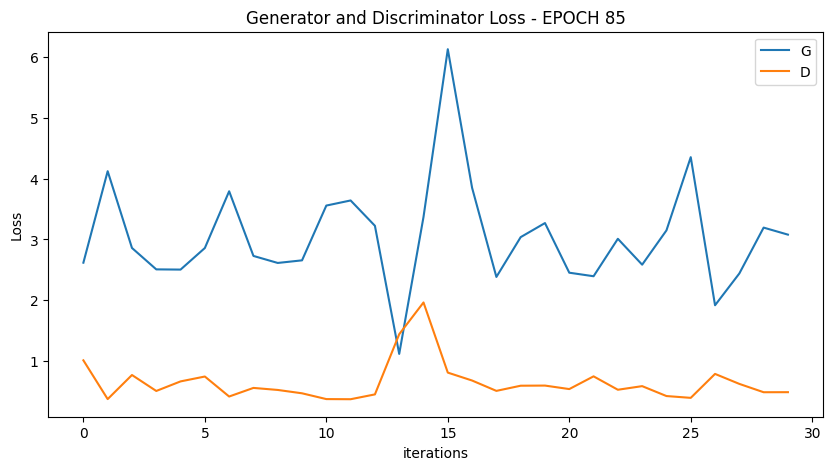

  0%|          | 0/30 [00:00<?, ?it/s]

[87/100][15/30] Loss_D: 0.4002 Loss_G: 4.2544 D(x): 0.8005 D(G(z)): 0.0187 / 0.0141
[87/100][30/30] Loss_D: 0.5012 Loss_G: 3.2614 D(x): 0.7645 D(G(z)): 0.0887 / 0.0365


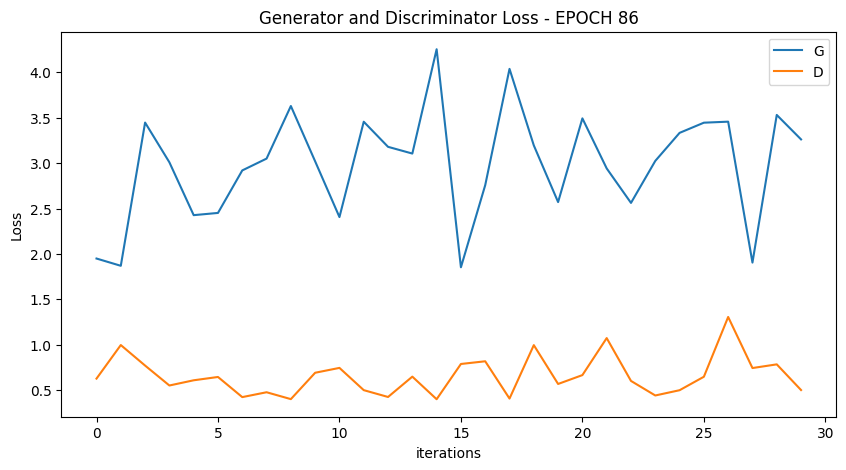

  0%|          | 0/30 [00:00<?, ?it/s]

[88/100][15/30] Loss_D: 0.4787 Loss_G: 3.2482 D(x): 0.8669 D(G(z)): 0.1216 / 0.0319
[88/100][30/30] Loss_D: 0.4851 Loss_G: 3.0519 D(x): 0.7612 D(G(z)): 0.0762 / 0.0462


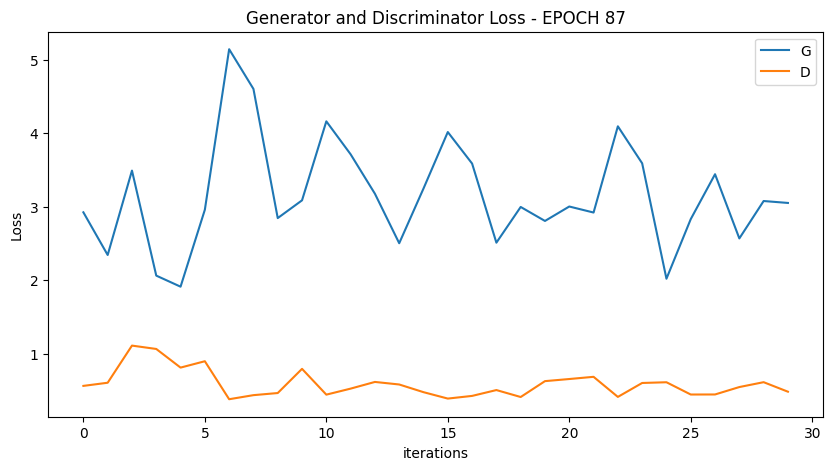

  0%|          | 0/30 [00:00<?, ?it/s]

[89/100][15/30] Loss_D: 0.9307 Loss_G: 2.5801 D(x): 0.6293 D(G(z)): 0.2640 / 0.0865
[89/100][30/30] Loss_D: 0.6296 Loss_G: 3.0340 D(x): 0.9776 D(G(z)): 0.1458 / 0.0466


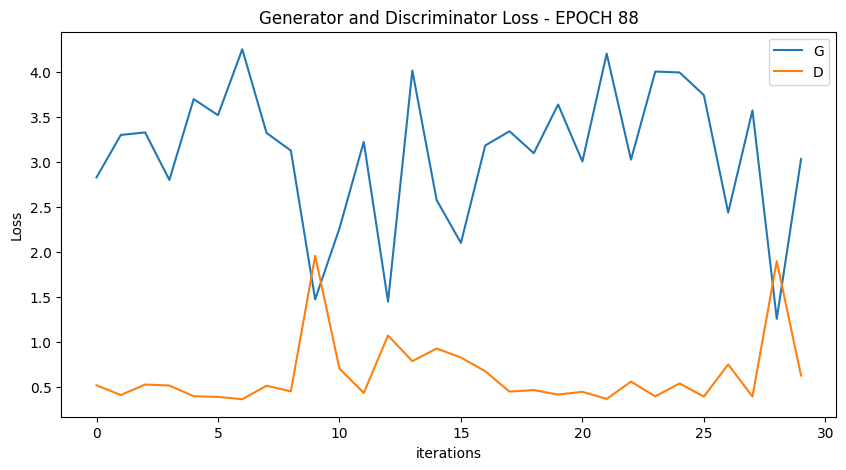

  0%|          | 0/30 [00:00<?, ?it/s]

[90/100][15/30] Loss_D: 0.5981 Loss_G: 2.6011 D(x): 0.8321 D(G(z)): 0.1838 / 0.0690
[90/100][30/30] Loss_D: 0.6061 Loss_G: 3.8001 D(x): 0.8837 D(G(z)): 0.1691 / 0.0241


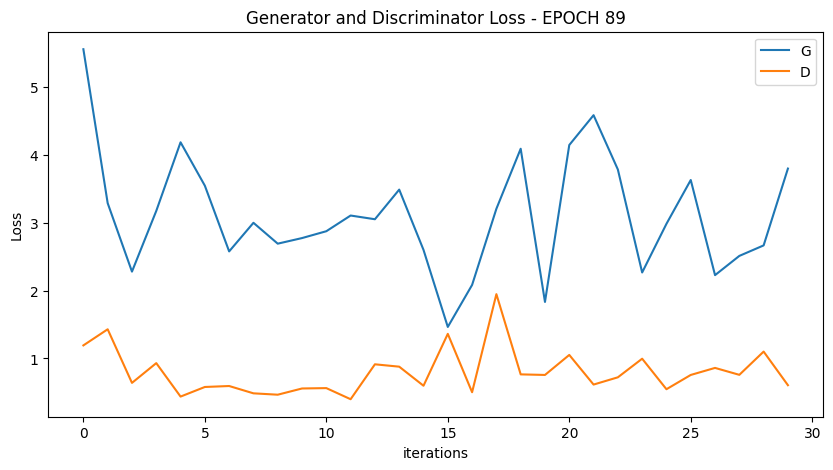

  0%|          | 0/30 [00:00<?, ?it/s]

[91/100][15/30] Loss_D: 0.4626 Loss_G: 3.4777 D(x): 0.8838 D(G(z)): 0.1023 / 0.0313
[91/100][30/30] Loss_D: 0.4382 Loss_G: 2.8782 D(x): 0.8152 D(G(z)): 0.0627 / 0.0492


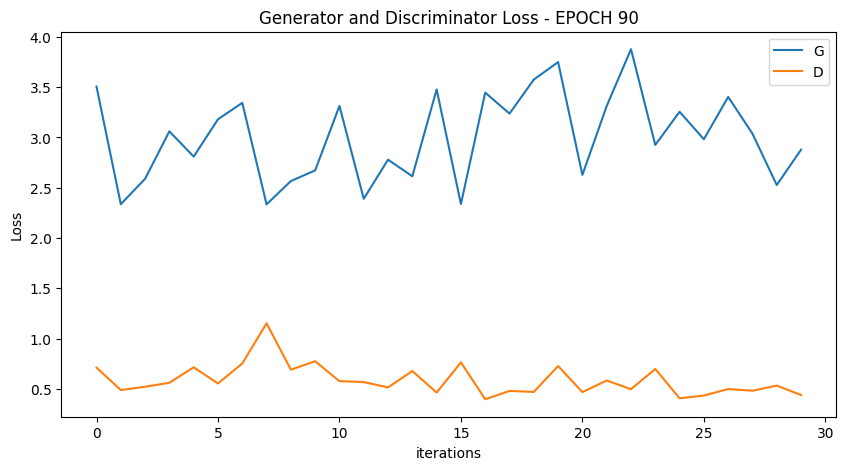

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


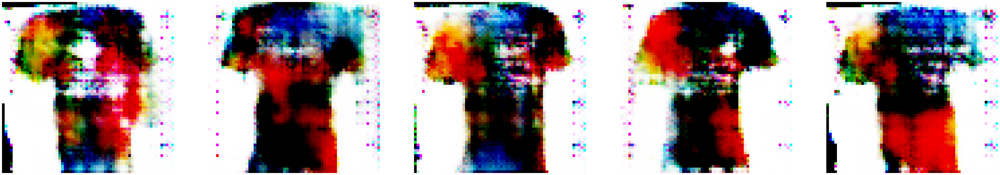

  0%|          | 0/30 [00:00<?, ?it/s]

[92/100][15/30] Loss_D: 0.3826 Loss_G: 3.4377 D(x): 0.8880 D(G(z)): 0.0249 / 0.0304
[92/100][30/30] Loss_D: 1.2642 Loss_G: 4.1644 D(x): 0.9580 D(G(z)): 0.4940 / 0.0158


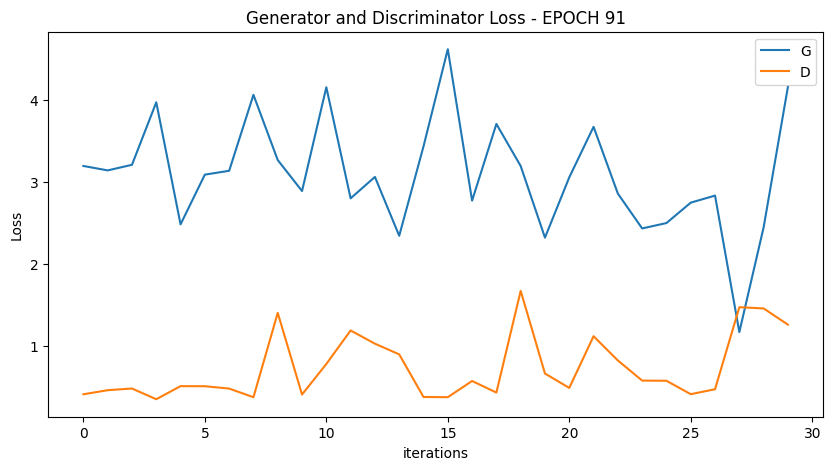

  0%|          | 0/30 [00:00<?, ?it/s]

[93/100][15/30] Loss_D: 1.1379 Loss_G: 3.6861 D(x): 0.9665 D(G(z)): 0.4890 / 0.0274
[93/100][30/30] Loss_D: 0.7301 Loss_G: 2.6833 D(x): 0.5602 D(G(z)): 0.0583 / 0.0687


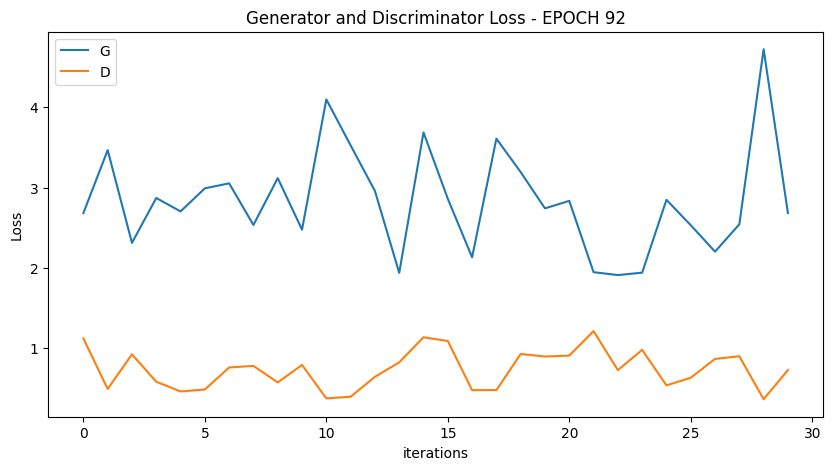

  0%|          | 0/30 [00:00<?, ?it/s]

[94/100][15/30] Loss_D: 0.6421 Loss_G: 2.3968 D(x): 0.6478 D(G(z)): 0.0872 / 0.1040
[94/100][30/30] Loss_D: 0.5741 Loss_G: 3.3901 D(x): 0.9585 D(G(z)): 0.1537 / 0.0320


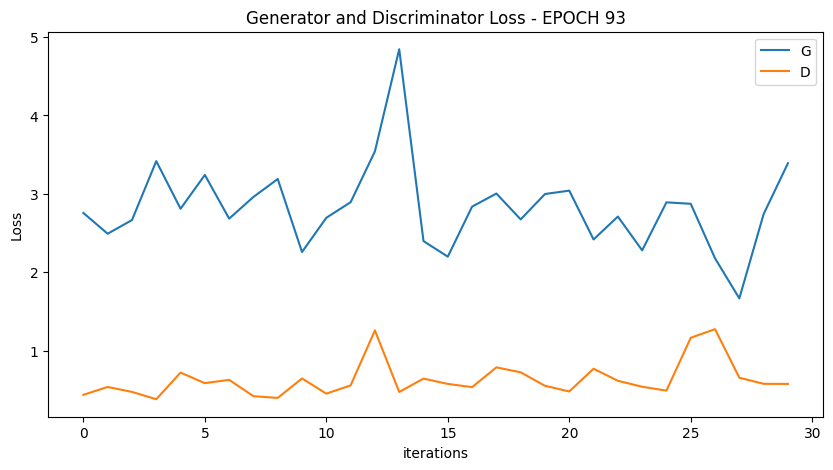

  0%|          | 0/30 [00:00<?, ?it/s]

[95/100][15/30] Loss_D: 0.6977 Loss_G: 3.0325 D(x): 0.8775 D(G(z)): 0.2791 / 0.0447
[95/100][30/30] Loss_D: 0.5250 Loss_G: 2.8677 D(x): 0.7660 D(G(z)): 0.0961 / 0.0546


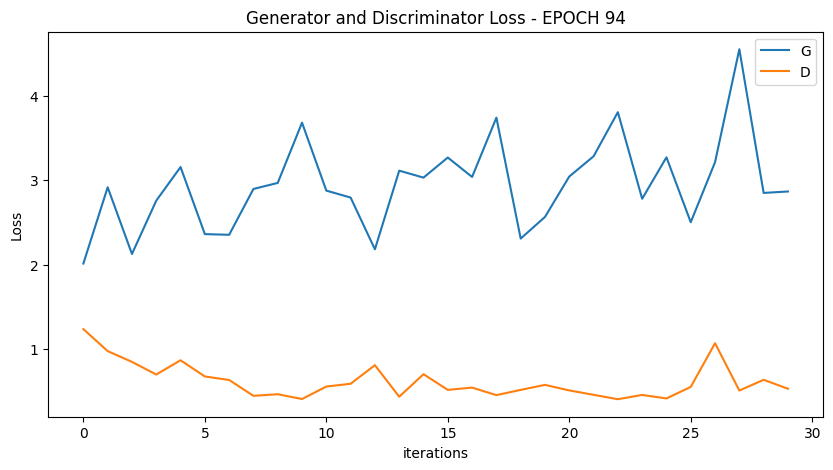

  0%|          | 0/30 [00:00<?, ?it/s]

[96/100][15/30] Loss_D: 0.4555 Loss_G: 3.0633 D(x): 0.7964 D(G(z)): 0.0587 / 0.0396
[96/100][30/30] Loss_D: 0.6133 Loss_G: 3.6887 D(x): 0.8793 D(G(z)): 0.2201 / 0.0208


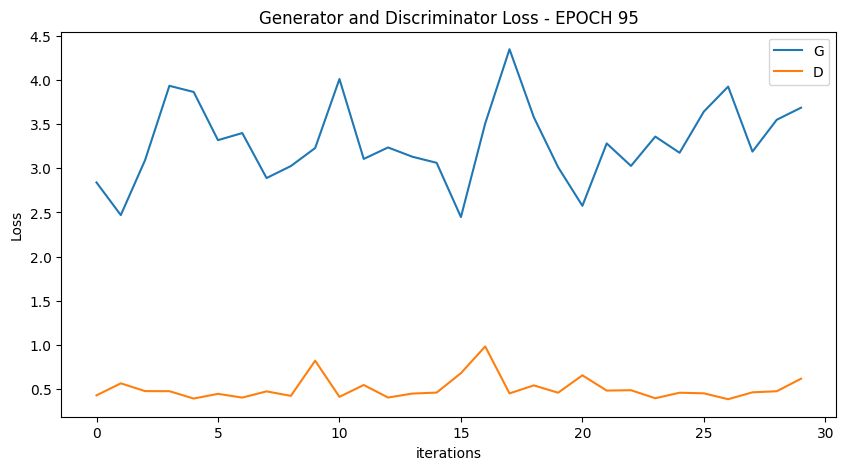

  0%|          | 0/30 [00:00<?, ?it/s]

[97/100][15/30] Loss_D: 1.2135 Loss_G: 4.2451 D(x): 0.9823 D(G(z)): 0.4870 / 0.0136
[97/100][30/30] Loss_D: 0.3732 Loss_G: 4.6348 D(x): 0.8338 D(G(z)): 0.0147 / 0.0087


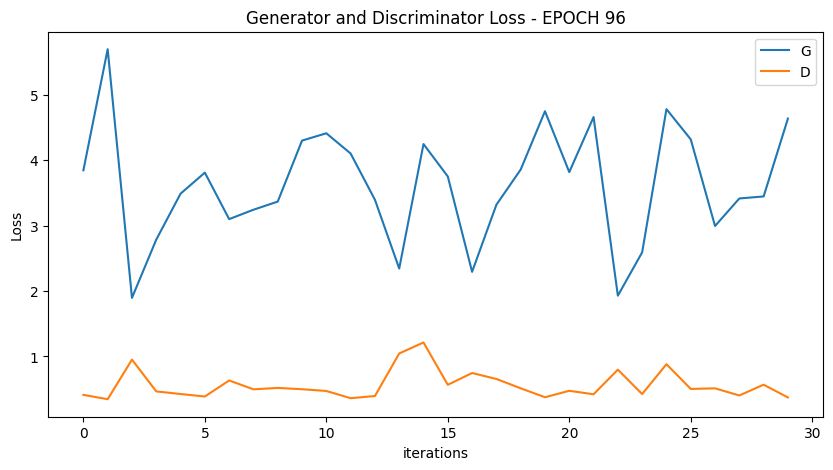

  0%|          | 0/30 [00:00<?, ?it/s]

[98/100][15/30] Loss_D: 1.4773 Loss_G: 3.7728 D(x): 0.9632 D(G(z)): 0.6082 / 0.0190
[98/100][30/30] Loss_D: 0.3957 Loss_G: 3.0168 D(x): 0.8458 D(G(z)): 0.0408 / 0.0444


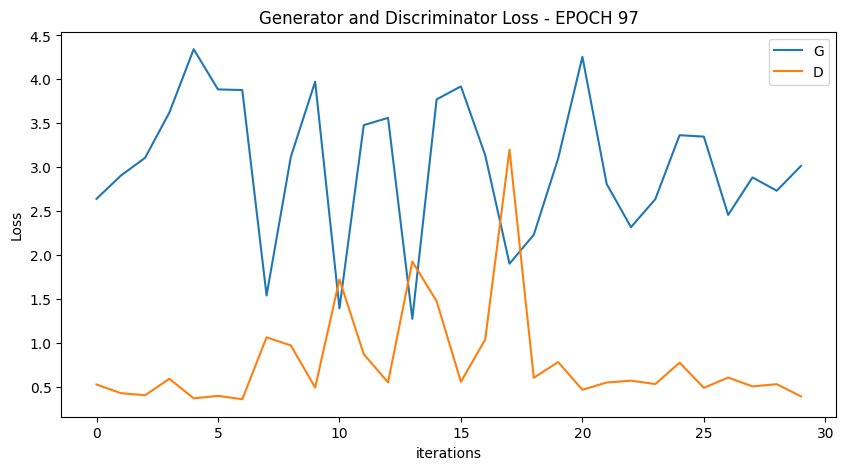

  0%|          | 0/30 [00:00<?, ?it/s]

[99/100][15/30] Loss_D: 0.4562 Loss_G: 2.9442 D(x): 0.7828 D(G(z)): 0.0579 / 0.0534
[99/100][30/30] Loss_D: 0.4993 Loss_G: 2.9100 D(x): 0.7580 D(G(z)): 0.0481 / 0.0565


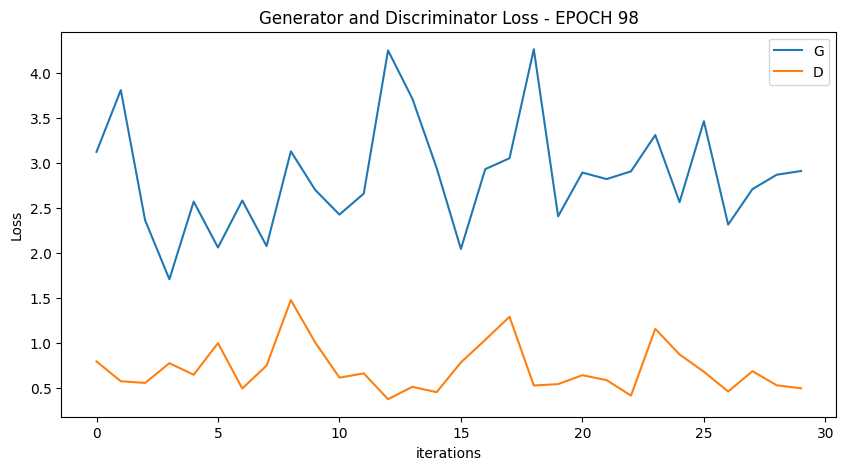

  0%|          | 0/30 [00:00<?, ?it/s]

[100/100][15/30] Loss_D: 0.4664 Loss_G: 2.7092 D(x): 0.7803 D(G(z)): 0.0621 / 0.0659
[100/100][30/30] Loss_D: 1.1769 Loss_G: 2.8894 D(x): 0.5305 D(G(z)): 0.3648 / 0.0457


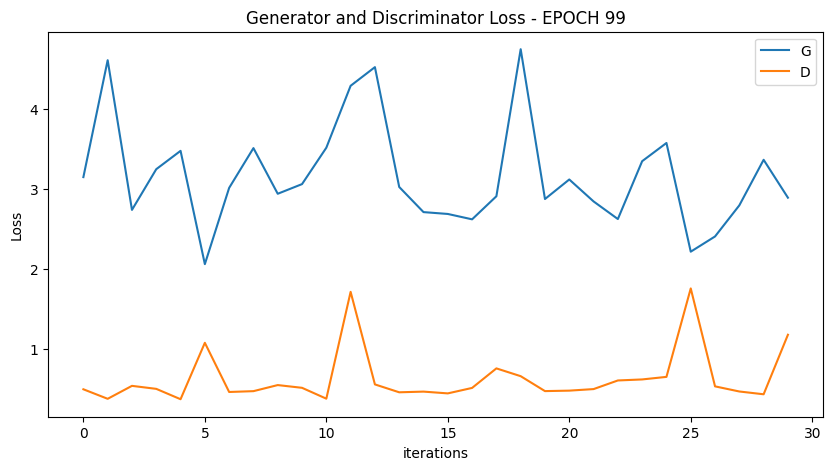

In [26]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [27]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  72.25211362600326


# Generation example


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


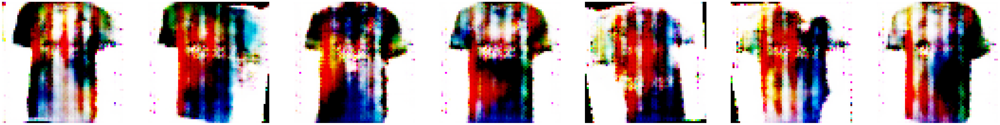

In [28]:
show_generated_img(7)

In [29]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

C:\Users\Muhammad Rafay\AppData\Local\Temp\ipykernel_17764\2441337517.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/200 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

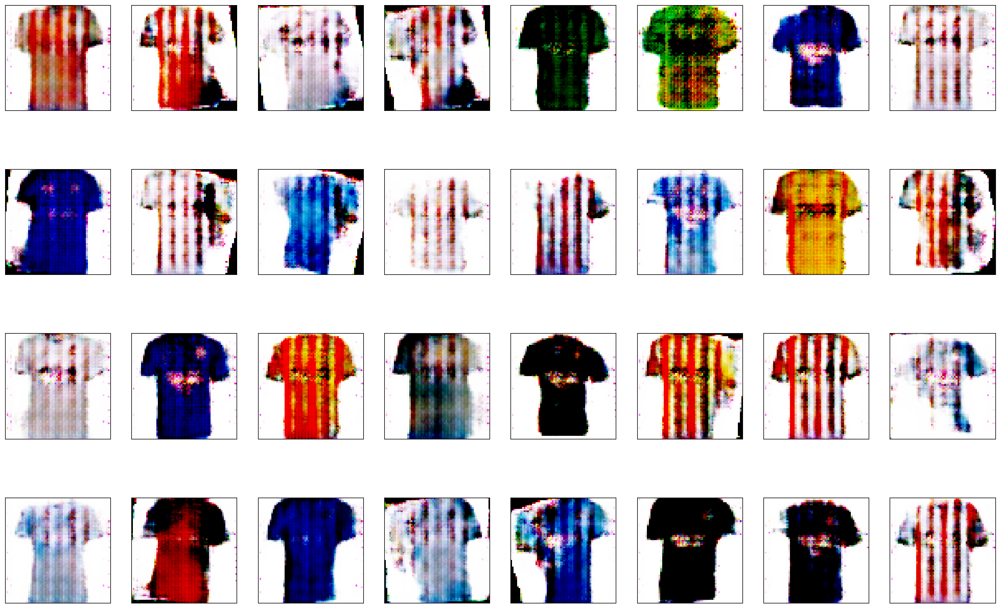

In [30]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

### Submission

In [31]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'c:\\Hashir\\Photos - Copy\\images.zip'

### Save models

In [32]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

# MiFID metric

In [33]:
from __future__ import absolute_import, division, print_function
import numpy as np
import os
import gzip, pickle
import tensorflow as tf
from scipy import linalg
import pathlib
import urllib
import warnings
from PIL import Image

class KernelEvalException(Exception):
    pass

model_params = {
    'Inception': {
        'name': 'Inception', 
        'imsize': 64,
        'output_layer': 'Pretrained_Net/pool_3:0', 
        'input_layer': 'Pretrained_Net/ExpandDims:0',
        'output_shape': 2048,
        'cosine_distance_eps': 0.1
        }
}

def create_model_graph(pth):
    """Creates a graph from saved GraphDef file."""
    # Creates graph from saved graph_def.pb.
    with tf.gfile.FastGFile( pth, 'rb') as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString( f.read())
        _ = tf.import_graph_def( graph_def, name='Pretrained_Net')

def _get_model_layer(sess, model_name):
    # layername = 'Pretrained_Net/final_layer/Mean:0'
    layername = model_params[model_name]['output_layer']
    layer = sess.graph.get_tensor_by_name(layername)
    ops = layer.graph.get_operations()
    for op_idx, op in enumerate(ops):
        for o in op.outputs:
            shape = o.get_shape()
            if shape._dims != []:
              shape = [s.value for s in shape]
              new_shape = []
              for j, s in enumerate(shape):
                if s == 1 and j == 0:
                  new_shape.append(None)
                else:
                  new_shape.append(s)
              o.__dict__['_shape_val'] = tf.TensorShape(new_shape)
    return layer

def get_activations(images, sess, model_name, batch_size=50, verbose=False):
    """Calculates the activations of the pool_3 layer for all images.

    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 256.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the disposable hardware.
    -- verbose    : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- A numpy array of dimension (num images, 2048) that contains the
       activations of the given tensor when feeding inception with the query tensor.
    """
    inception_layer = _get_model_layer(sess, model_name)
    n_images = images.shape[0]
    if batch_size > n_images:
        print("warning: batch size is bigger than the data size. setting batch size to data size")
        batch_size = n_images
    n_batches = n_images//batch_size + 1
    pred_arr = np.empty((n_images,model_params[model_name]['output_shape']))
    for i in tqdm(range(n_batches)):
        if verbose:
            print("\rPropagating batch %d/%d" % (i+1, n_batches), end="", flush=True)
        start = i*batch_size
        if start+batch_size < n_images:
            end = start+batch_size
        else:
            end = n_images
                    
        batch = images[start:end]
        pred = sess.run(inception_layer, {model_params[model_name]['input_layer']: batch})
        pred_arr[start:end] = pred.reshape(-1,model_params[model_name]['output_shape'])
    if verbose:
        print(" done")
    return pred_arr


# def calculate_memorization_distance(features1, features2):
#     neigh = NearestNeighbors(n_neighbors=1, algorithm='kd_tree', metric='euclidean')
#     neigh.fit(features2) 
#     d, _ = neigh.kneighbors(features1, return_distance=True)
#     print('d.shape=',d.shape)
#     return np.mean(d)

def normalize_rows(x: np.ndarray):
    """
    function that normalizes each row of the matrix x to have unit length.

    Args:
     ``x``: A numpy matrix of shape (n, m)

    Returns:
     ``x``: The normalized (by row) numpy matrix.
    """
    return np.nan_to_num(x/np.linalg.norm(x, ord=2, axis=1, keepdims=True))


def cosine_distance(features1, features2):
    # print('rows of zeros in features1 = ',sum(np.sum(features1, axis=1) == 0))
    # print('rows of zeros in features2 = ',sum(np.sum(features2, axis=1) == 0))
    features1_nozero = features1[np.sum(features1, axis=1) != 0]
    features2_nozero = features2[np.sum(features2, axis=1) != 0]
    norm_f1 = normalize_rows(features1_nozero)
    norm_f2 = normalize_rows(features2_nozero)

    d = 1.0-np.abs(np.matmul(norm_f1, norm_f2.T))
    print('d.shape=',d.shape)
    print('np.min(d, axis=1).shape=',np.min(d, axis=1).shape)
    mean_min_d = np.mean(np.min(d, axis=1))
    print('distance=',mean_min_d)
    return mean_min_d


def distance_thresholding(d, eps):
    if d < eps:
        return d
    else:
        return 1

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
            
    Stable version by Dougal J. Sutherland.

    Params:
    -- mu1 : Numpy array containing the activations of the pool_3 layer of the
             inception net ( like returned by the function 'get_predictions')
             for generated samples.
    -- mu2   : The sample mean over activations of the pool_3 layer, precalcualted
               on an representive data set.
    -- sigma1: The covariance matrix over activations of the pool_3 layer for
               generated samples.
    -- sigma2: The covariance matrix over activations of the pool_3 layer,
               precalcualted on an representive data set.

    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, "Training and test mean vectors have different lengths"
    assert sigma1.shape == sigma2.shape, "Training and test covariances have different dimensions"

    diff = mu1 - mu2

    # product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = "fid calculation produces singular product; adding %s to diagonal of cov estimates" % eps
        warnings.warn(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        # covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
    
    # numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError("Imaginary component {}".format(m))
        covmean = covmean.real

    # covmean = tf.linalg.sqrtm(tf.linalg.matmul(sigma1,sigma2))

    print('covmean.shape=',covmean.shape)
    # tr_covmean = tf.linalg.trace(covmean)

    tr_covmean = np.trace(covmean)
    return diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean
    # return diff.dot(diff) + tf.linalg.trace(sigma1) + tf.linalg.trace(sigma2) - 2 * tr_covmean
#-------------------------------------------------------------------------------


def calculate_activation_statistics(images, sess, model_name, batch_size=50, verbose=False):
    """Calculation of the statistics used by the FID.
    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 255.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the available hardware.
    -- verbose     : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- mu    : The mean over samples of the activations of the pool_3 layer of
               the incption model.
    -- sigma : The covariance matrix of the activations of the pool_3 layer of
               the incption model.
    """
    act = get_activations(images, sess, model_name, batch_size, verbose)
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma, act
    
def _handle_path_memorization(path, sess, model_name, is_checksize, is_check_png):
    path = pathlib.Path(path)
    files = list(path.glob('*.jpg')) + list(path.glob('*.png'))
    imsize = model_params[model_name]['imsize']

    # In production we don't resize input images. This is just for demo purpose. 
    x = np.array([np.array(img_read_checks(fn, imsize, is_checksize, imsize, is_check_png)) for fn in files])
    m, s, features = calculate_activation_statistics(x, sess, model_name)
    del x #clean up memory
    return m, s, features

# check for image size
def img_read_checks(filename, resize_to, is_checksize=False, check_imsize = 64, is_check_png = False):
    im = Image.open(str(filename))
    if is_checksize and im.size != (check_imsize,check_imsize):
        raise KernelEvalException('The images are not of size '+str(check_imsize))
    
    if is_check_png and im.format != 'PNG':
        raise KernelEvalException('Only PNG images should be submitted.')

    if resize_to is None:
        return im
    else:
        return im.resize((resize_to,resize_to),Image.ANTIALIAS)

def calculate_kid_given_paths(paths, model_name, model_path, feature_path=None):
    ''' Calculates the KID of two paths. '''
    tf.reset_default_graph()
    create_model_graph(str(model_path))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        m1, s1, features1 = _handle_path_memorization(paths[0], sess, model_name, is_checksize = True, is_check_png = True)
        if feature_path is None:
            m2, s2, features2 = _handle_path_memorization(paths[1], sess, model_name, is_checksize = False, is_check_png = False)
        else:
            with np.load(feature_path) as f:
                m2, s2, features2 = f['m'], f['s'], f['features']

        print('m1,m2 shape=',(m1.shape,m2.shape),'s1,s2=',(s1.shape,s2.shape))
        print('starting calculating FID')
        fid_value = calculate_frechet_distance(m1, s1, m2, s2)
        print('done with FID, starting distance calculation')
        distance = cosine_distance(features1, features2)        
        return fid_value, distance

In [35]:
import os

directory = '../output_images'
print(os.listdir(directory))


['image_00000.png', 'image_00001.png', 'image_00002.png', 'image_00003.png', 'image_00004.png', 'image_00005.png', 'image_00006.png', 'image_00007.png', 'image_00008.png', 'image_00009.png', 'image_00010.png', 'image_00011.png', 'image_00012.png', 'image_00013.png', 'image_00014.png', 'image_00015.png', 'image_00016.png', 'image_00017.png', 'image_00018.png', 'image_00019.png', 'image_00020.png', 'image_00021.png', 'image_00022.png', 'image_00023.png', 'image_00024.png', 'image_00025.png', 'image_00026.png', 'image_00027.png', 'image_00028.png', 'image_00029.png', 'image_00030.png', 'image_00031.png', 'image_00032.png', 'image_00033.png', 'image_00034.png', 'image_00035.png', 'image_00036.png', 'image_00037.png', 'image_00038.png', 'image_00039.png', 'image_00040.png', 'image_00041.png', 'image_00042.png', 'image_00043.png', 'image_00044.png', 'image_00045.png', 'image_00046.png', 'image_00047.png', 'image_00048.png', 'image_00049.png', 'image_00050.png', 'image_00051.png', 'image_0005